In [1]:
import matplotlib.pyplot as plt

from skimage.color import rgb2gray, rgba2rgb
import skimage.io as skio
from skimage.util.shape import view_as_windows
from skimage.transform import resize

import numpy as np
import pandas as pd 
from scipy import stats  
from einops import rearrange, reduce, repeat

import itertools
import os
import sys
import glob
import warnings
import tqdm

from utils import default_paths, nsd_utils

import copy


In [2]:
from analyze_features import analyze_im_curvature

In [3]:
# image_size = 424;
image_size = 128;
# scale_values = np.linspace(6,12,4)
scale_values = np.linspace(2,8,4)
bend_values= [0, 0.04, 0.08, 0.16, 0.32, 0.64]

bank = analyze_im_curvature.bent_gabor_feature_bank(scale_values = scale_values, bend_values=bend_values, image_size=image_size)

scale values
[2. 4. 6. 8.]
bend values
[0, 0.04, 0.08, 0.16, 0.32, 0.64]
orient values
[0.         0.78539816 1.57079633 2.35619449 3.14159265 3.92699082
 4.71238898 5.49778714]


(0.0, 128.0, 0.0, 128.0)

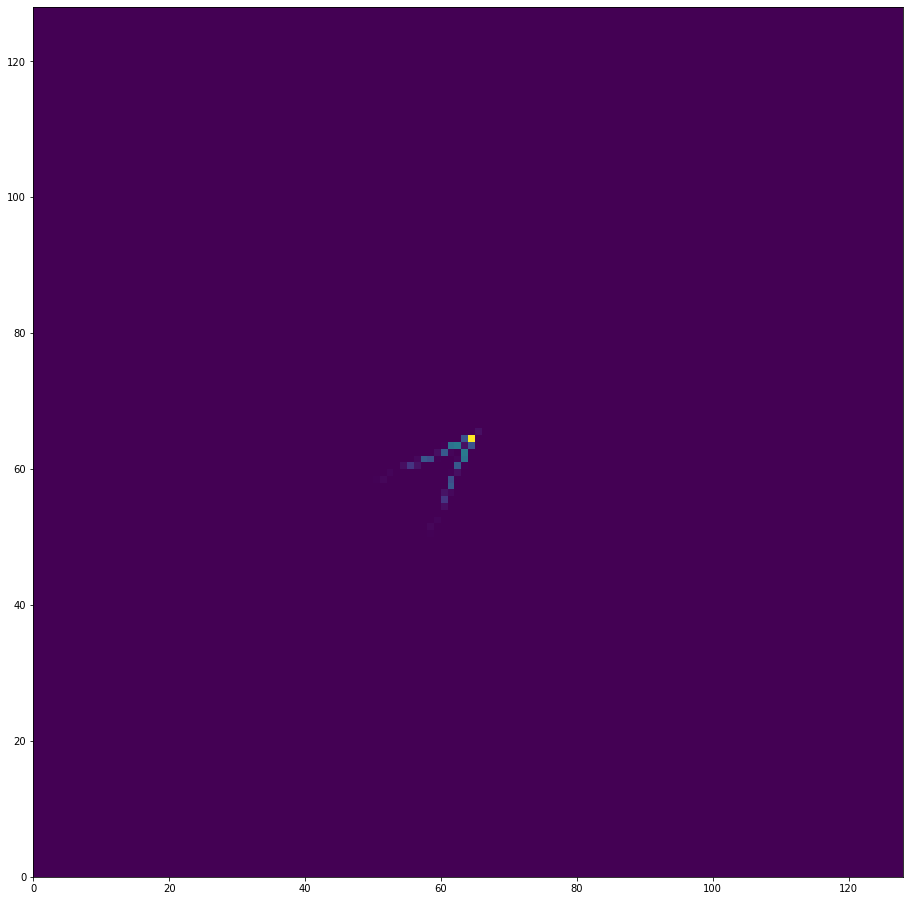

In [5]:
plt.figure(figsize=(16,16));
kernel_ind = np.where((bank.curv_kernel_pars[:,0]==bank.kA[0]) &\
                     (bank.curv_kernel_pars[:,1]==0.64) & \
                     (bank.curv_kernel_pars[:,2]==bank.orient_values[1]))[0][0]
plt.pcolormesh(np.abs(bank.kernels['rect_space'][kernel_ind]))
plt.axis('square')

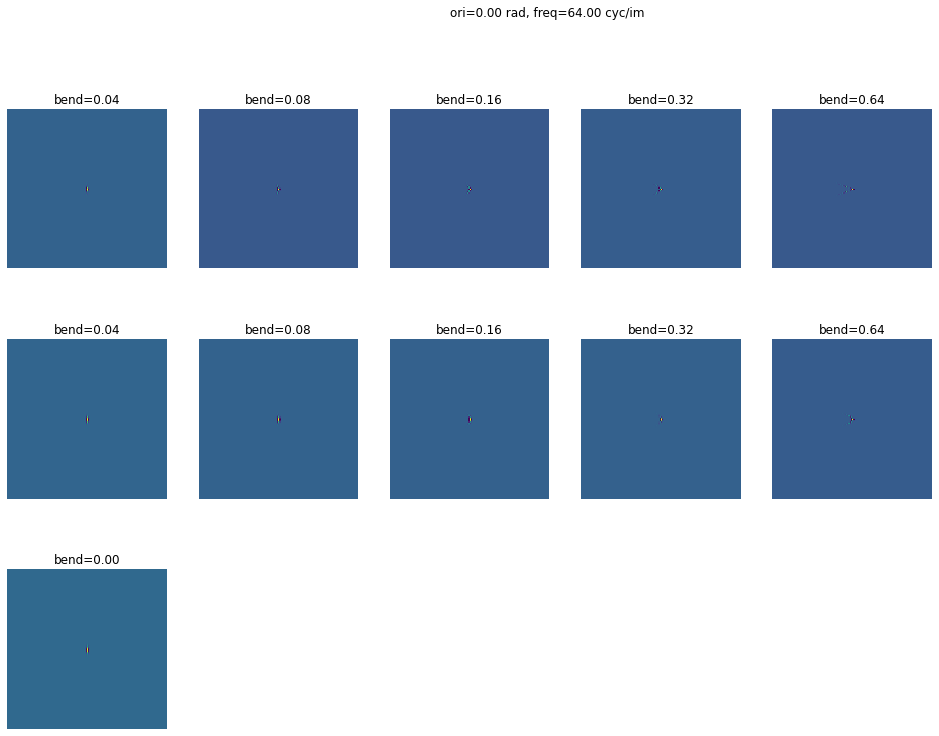

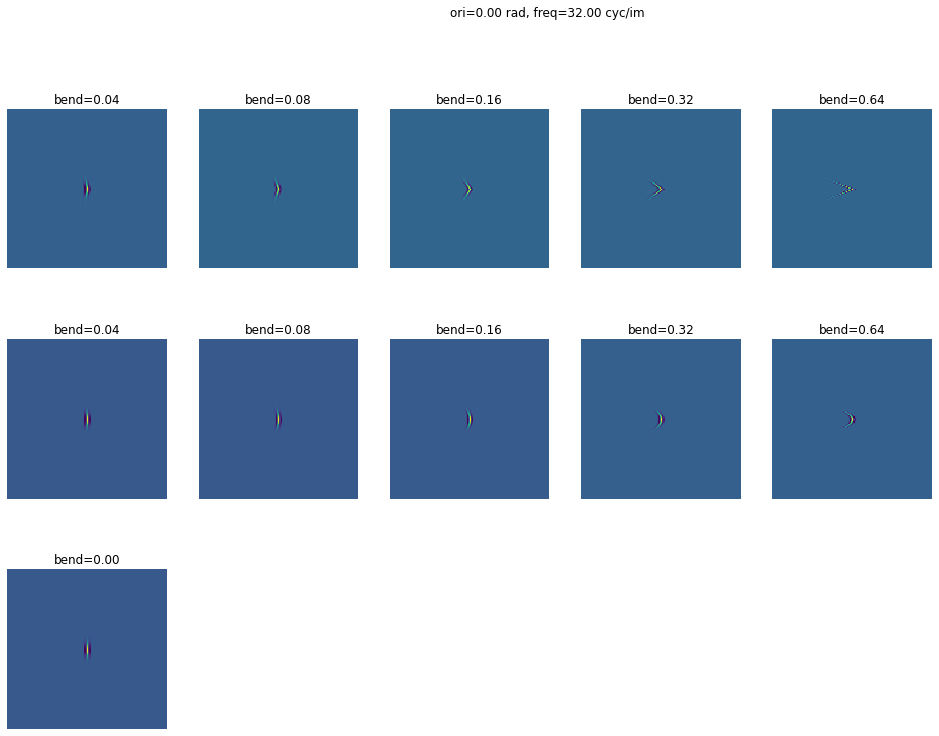

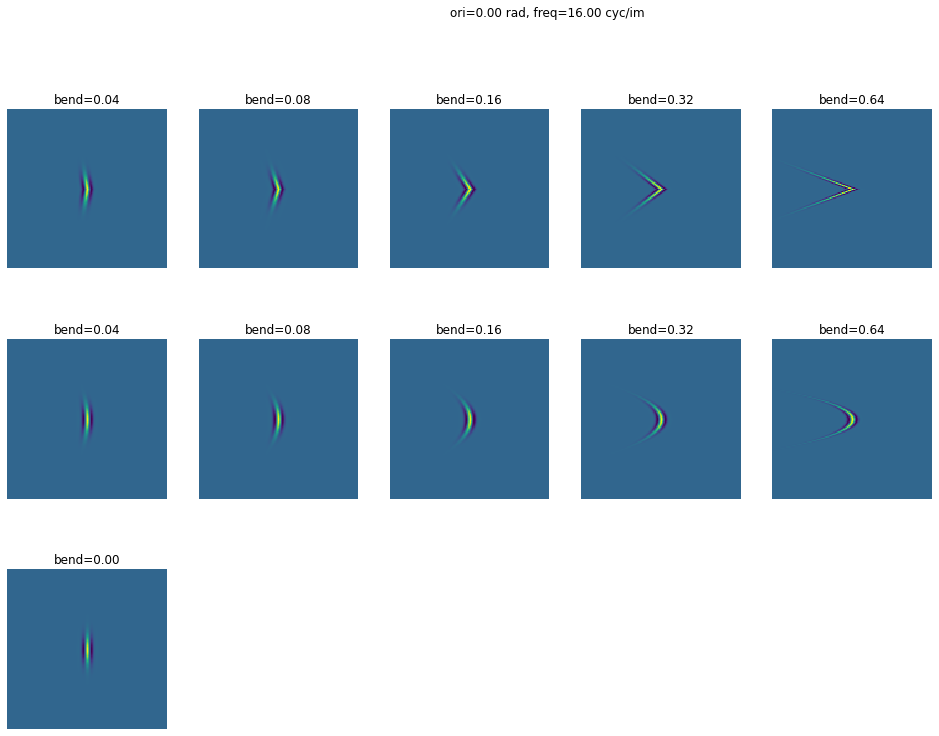

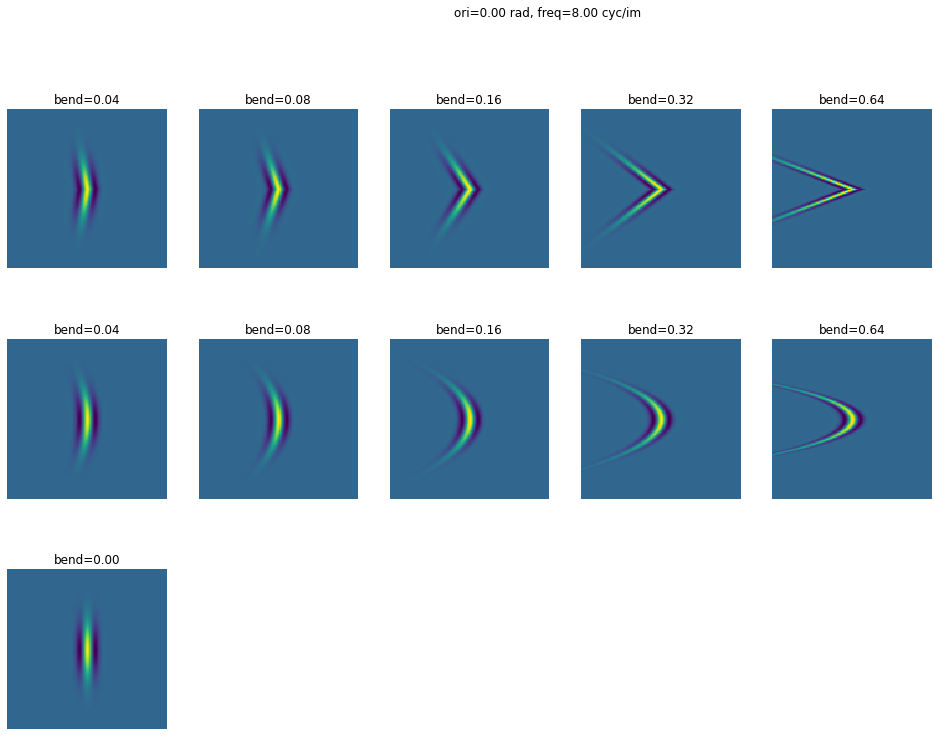

In [4]:
for sc in range(len(scale_values)):
    bank.plot_kernel_bends(scale_ind=sc)

In [6]:
image_folder = '/lab_data/tarrlab/common/datasets/NSD_images/images/';

subject_df = nsd_utils.get_subj_df(1);
n_images = 100;
image_ind = np.random.choice(np.arange(0,10000), n_images, replace=False)
coco_id = np.array(subject_df['cocoId'])[image_ind]
file_list = [os.path.join(image_folder,'%d.jpg'%cid) for cid in coco_id]

# save_filename = os.path.join(default_paths.sketch_token_feat_path, 'test_random_cocoims_curv_rect_values.csv')
fn2save = os.path.join(default_paths.sketch_token_feat_path, 'test_random_cocoims_curv_rect_values.npy')
print('will save to %s\n'%(fn2save)) 




will save to /user_data/mmhender/features/sketch_tokens/test_random_cocoims_curv_rect_values.npy



In [7]:

def patchnorm(image):
    
    if image.shape[0]%3 == 0:
        patch_size = 3
    else:
        patch_size = 4

    """create patches with the patch_size"""
    patches = view_as_windows(image, (patch_size,patch_size), patch_size)

    """ caculate norm of the local patches """ 
    local_norm = np.sqrt(np.einsum('ijkl->ij',patches**2))
    local_norm[local_norm<1] = 1

    """normalize local patches """ 
    normed_patches = patches/local_norm[:,:,np.newaxis,np.newaxis]

    """reshape normalized local patch to original shape """ 
#         local_normed_image = normed_patches.transpose(0,2,1,3).reshape(-1,normed_patches.shape[1]*normed_patches.shape[3])
    local_normed_image = rearrange(normed_patches,'h w c d -> (h c) (w d)')

    return local_normed_image

 

In [8]:
all_curv_filt_coeffs = []
all_rect_filt_coeffs = []
all_lin_filt_coeffs = []

batch_size = 10;
n_batches = int(np.ceil(n_images/batch_size))


for bb in range(n_batches):

    batch_inds = np.arange(batch_size*bb, np.min([batch_size*(bb+1), n_images]))

    file_list_batch = np.array(file_list)[batch_inds]
    image_list = []
    print('loading images, batch %d of %d'%(bb, n_batches))

    for fi, filename in enumerate(file_list_batch):

        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)
        image_list.append(image_gray)
#         image_normed = patchnorm(image_gray)

#         image_list.append(image_normed)

    image_batch = np.dstack(image_list)

    print('processing images w filter bank')
    sys.stdout.flush()
    
    curv_filt_coeffs = bank.filter_image_batch(image_batch, which_kernels='curv')
    rect_filt_coeffs = bank.filter_image_batch(image_batch, which_kernels='rect')
    lin_filt_coeffs = bank.filter_image_batch(image_batch, which_kernels='linear')

    if bb==0:
        all_curv_filt_coeffs = curv_filt_coeffs
        all_rect_filt_coeffs = rect_filt_coeffs
        all_lin_filt_coeffs = lin_filt_coeffs
    else:
        all_curv_filt_coeffs = np.concatenate([all_curv_filt_coeffs, curv_filt_coeffs], axis=3)
        all_rect_filt_coeffs = np.concatenate([all_rect_filt_coeffs, rect_filt_coeffs], axis=3)
        all_lin_filt_coeffs = np.concatenate([all_lin_filt_coeffs, lin_filt_coeffs], axis=3)


dict2save = {'file_list': file_list, 
             'all_curv_filt_coeffs': all_curv_filt_coeffs, 
             'all_rect_filt_coeffs': all_rect_filt_coeffs,
             'all_lin_filt_coeffs': all_lin_filt_coeffs,
             'curv_kernel_pars': bank.curv_kernel_pars, 
             'rect_kernel_pars': bank.rect_kernel_pars, 
             'lin_kernel_pars': bank.lin_kernel_pars}

# print('saving to %s\n'%(fn2save))    
# np.save(fn2save, dict2save)

loading images, batch 0 of 10
processing images w filter bank
loading images, batch 1 of 10
processing images w filter bank
loading images, batch 2 of 10
processing images w filter bank
loading images, batch 3 of 10
processing images w filter bank
loading images, batch 4 of 10
processing images w filter bank
loading images, batch 5 of 10
processing images w filter bank
loading images, batch 6 of 10
processing images w filter bank
loading images, batch 7 of 10
processing images w filter bank
loading images, batch 8 of 10
processing images w filter bank
loading images, batch 9 of 10
processing images w filter bank


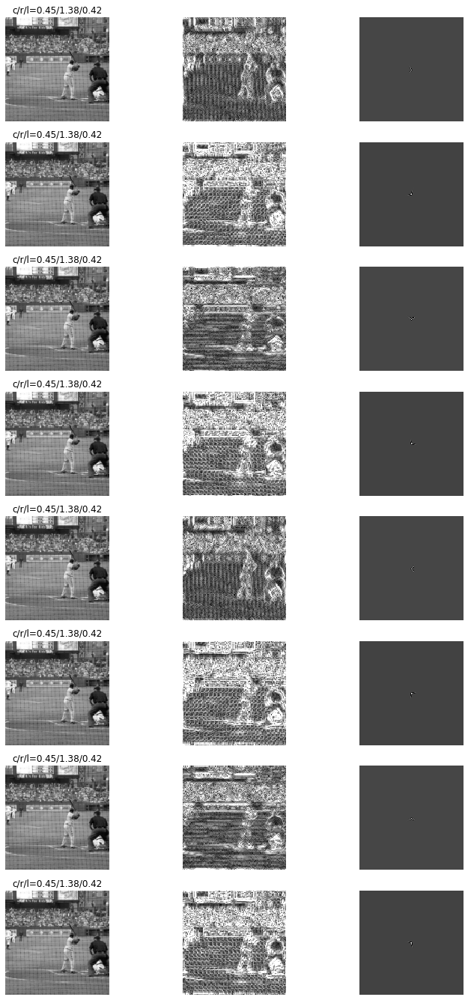

In [44]:
sc = bank.kA[0];
bb = bank.bend_values[3];

n_orients = len(bank.orient_values)

# ii = 64
ii = 76
filename = file_list[ii]
image_raw = skio.imread(filename)
image_resized = resize(image_raw, [image_size, image_size])
image_gray = rgb2gray(image_resized)
# image_normed = patchnorm(image_gray)

plt.figure(figsize=(12,24))

pi=0;
for oo in range(n_orients):

    kernel_ind = np.where((bank.rect_kernel_pars[:,0]==sc) & \
                (bank.rect_kernel_pars[:,1]==bb) & \
                (bank.rect_kernel_pars[:,2]==bank.orient_values[oo]))[0][0]
    
    spat_kernel = bank.kernels['rect_space'][kernel_ind]
    
    pi+=1
    plt.subplot(n_orients,3,pi)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

    pi+=1
    plt.subplot(n_orients,3,pi)
    plt.pcolormesh(all_rect_filt_coeffs[:,:,kernel_ind,ii],cmap='gray',vmin=0, vmax=0.1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
   
    pi+=1
    plt.subplot(n_orients,3,pi)
    plt.pcolormesh(np.real(spat_kernel),cmap='gray')
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
   

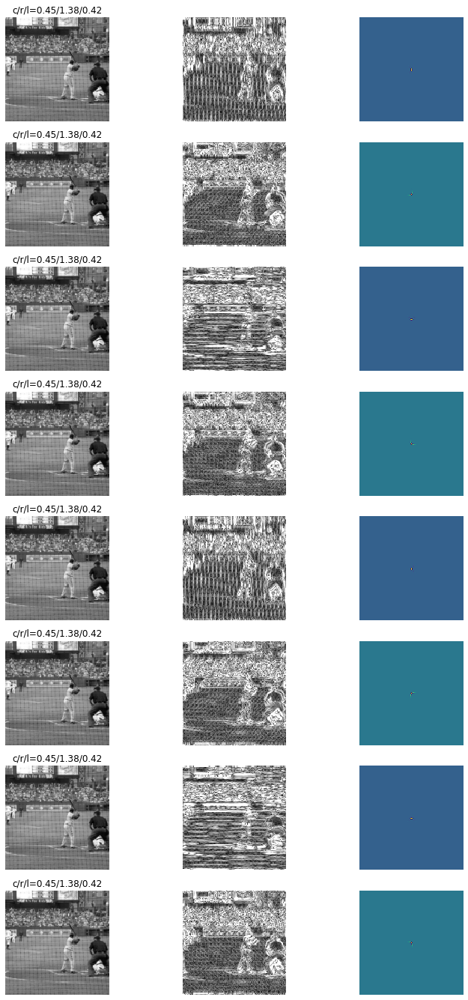

In [43]:
sc = bank.kA[0];
bb = bank.bend_values[4];

n_orients = len(bank.orient_values)

# ii = 72
ii = 76
filename = file_list[ii]
image_raw = skio.imread(filename)
image_resized = resize(image_raw, [image_size, image_size])
image_gray = rgb2gray(image_resized)
# image_normed = patchnorm(image_gray)

plt.figure(figsize=(12,24))

pi=0;
for oo in range(n_orients):

    kernel_ind = np.where((bank.curv_kernel_pars[:,0]==sc) & \
                (bank.curv_kernel_pars[:,1]==bb) & \
                (bank.curv_kernel_pars[:,2]==bank.orient_values[oo]))[0][0]
    
    spat_kernel = bank.kernels['curv_space'][kernel_ind]
    
    pi+=1
    plt.subplot(n_orients,3,pi)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

    pi+=1
    plt.subplot(n_orients,3,pi)
    plt.pcolormesh(all_curv_filt_coeffs[:,:,kernel_ind,ii],cmap='gray',vmin=0, vmax=0.1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
   
    pi+=1
    plt.subplot(n_orients,3,pi)
    plt.pcolormesh(np.real(spat_kernel))
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
   

In [100]:
kernel_ind

array([104])

In [10]:
max_curv_images = np.max(all_curv_filt_coeffs, axis=2)
max_rect_images = np.max(all_rect_filt_coeffs, axis=2)
max_lin_images = np.max(all_lin_filt_coeffs, axis=2)

unique_curv_inds = ((max_curv_images>max_rect_images) & (max_curv_images>max_lin_images))
unique_rect_inds = ((max_rect_images>max_curv_images) & (max_rect_images>max_lin_images))
unique_lin_inds = ((max_lin_images>max_curv_images) & (max_lin_images>max_rect_images))

unique_curv_ims = copy.deepcopy(max_curv_images)
unique_curv_ims[~unique_curv_inds] = 0.0
unique_rect_ims = copy.deepcopy(max_rect_images)
unique_rect_ims[~unique_rect_inds] = 0.0
unique_lin_ims = copy.deepcopy(max_lin_images)
unique_lin_ims[~unique_lin_inds] = 0.0

curv_unique_score = np.mean(np.mean(unique_curv_ims, axis=0), axis=0);
rect_unique_score = np.mean(np.mean(unique_rect_ims, axis=0), axis=0);
lin_unique_score = np.mean(np.mean(unique_lin_ims, axis=0), axis=0);

In [46]:
all_curv_filt_coeffs.shape

(128, 128, 160, 100)

In [89]:
# Not that bad

max_lin_images = np.max(all_lin_filt_coeffs, axis=2)
curv_score_each_bend = np.zeros((n_images, len(bank.bend_values)-1))
rect_score_each_bend = np.zeros((n_images, len(bank.bend_values)-1))

for bb,bend in enumerate(bank.bend_values[1:]):
    
    kernel_inds = bank.curv_kernel_pars[:,1]==bend

    max_curv_images = np.max(all_curv_filt_coeffs[:,:,kernel_inds,:], axis=2)
    max_rect_images = np.max(all_rect_filt_coeffs[:,:,kernel_inds,:], axis=2)
   
    unique_curv_inds = ((max_curv_images>max_rect_images) & (max_curv_images>max_lin_images))
    unique_rect_inds = ((max_rect_images>max_curv_images) & (max_rect_images>max_lin_images))
    
    unique_curv_ims = copy.deepcopy(max_curv_images)
    unique_curv_ims[~unique_curv_inds] = 0.0
    unique_rect_ims = copy.deepcopy(max_rect_images)
    unique_rect_ims[~unique_rect_inds] = 0.0
   
    curv_score_each_bend[:,bb] = np.mean(np.mean(unique_curv_ims, axis=0), axis=0);
    rect_score_each_bend[:,bb] = np.mean(np.mean(unique_rect_ims, axis=0), axis=0);
    

In [79]:

curv_score_each_bend = np.zeros((n_images, len(bank.bend_values)-1))
rect_score_each_bend = np.zeros((n_images, len(bank.bend_values)-1))

for bb,bend in enumerate(bank.bend_values[1:]):
    
    kernel_inds = bank.curv_kernel_pars[:,1]==bend

    curv_score_each_bend[:,bb] = np.mean(np.mean(np.mean(all_curv_filt_coeffs[:,:,kernel_inds,:], \
                                                         axis=0), axis=0), axis=0);
    rect_score_each_bend[:,bb] = np.mean(np.mean(np.mean(all_rect_filt_coeffs[:,:,kernel_inds,:], \
                                                         axis=0), axis=0), axis=0);
    

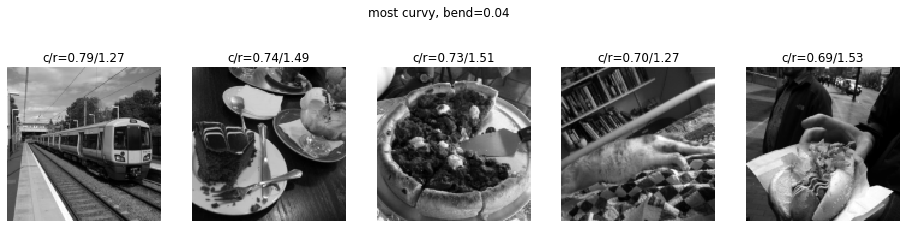

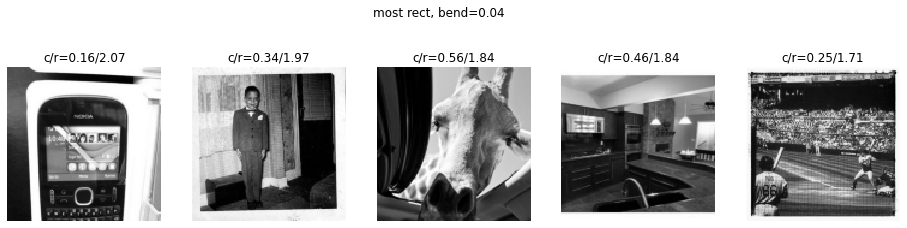

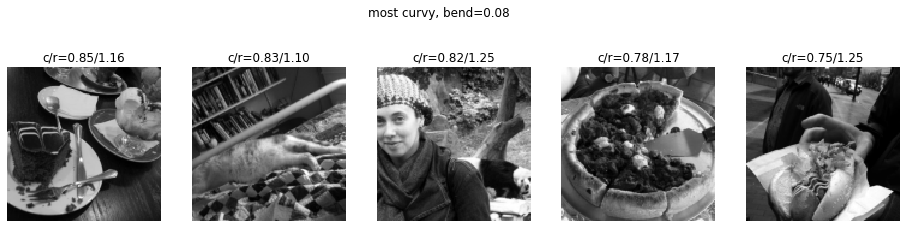

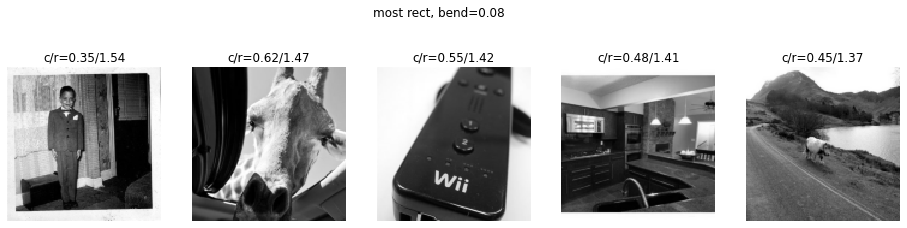

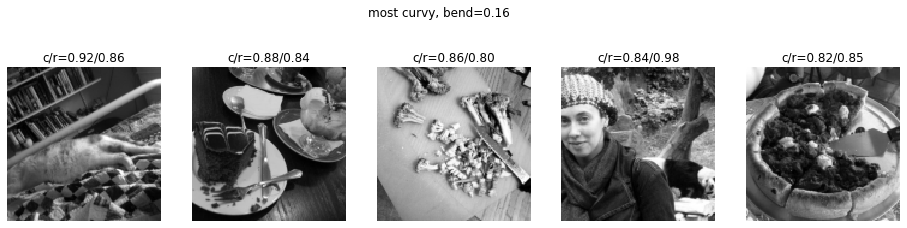

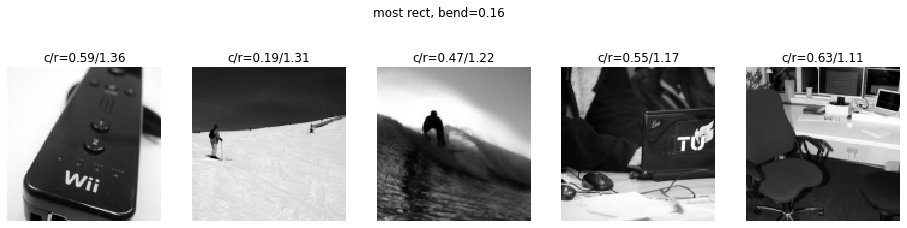

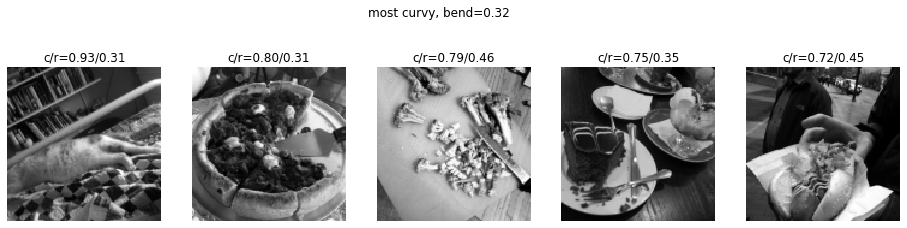

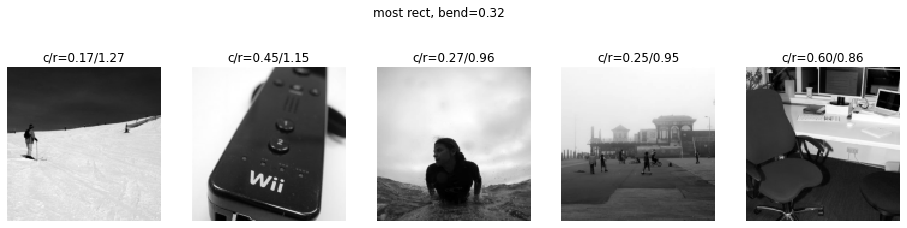

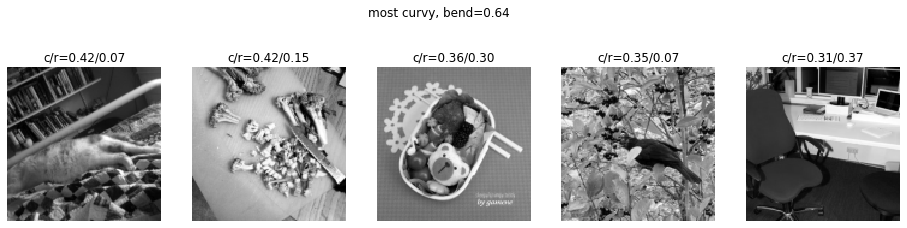

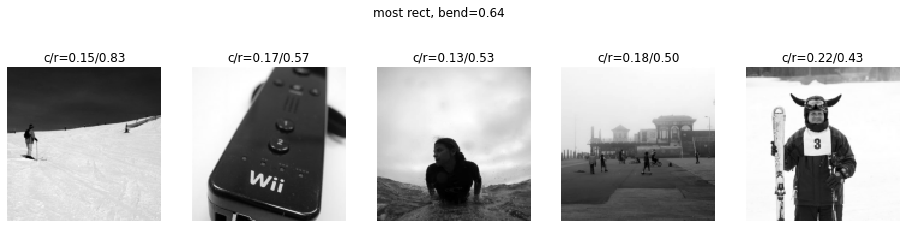

In [90]:
# Plot images sorted by their curviness

for bb in range(len(bank.bend_values)-1):

    sort_order = np.flip(np.argsort(curv_score_each_bend[:,bb]))[0:5]
#     combined_score = (curv_score_each_bend[:,bb] - rect_score_each_bend[:,bb])/ \
#                         (curv_score_each_bend[:,bb] + rect_score_each_bend[:,bb])

#     sort_order = np.flip(np.argsort(combined_score))[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(curv_score_each_bend[ii,bb], \
                                          rect_score_each_bend[ii,bb]))
    plt.suptitle('most curvy, bend=%.2f'%bank.bend_values[bb+1])

    sort_order = np.flip(np.argsort(rect_score_each_bend[:,bb]))[0:5]
#     sort_order = np.argsort(combined_score)[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(curv_score_each_bend[ii,bb], \
                                          rect_score_each_bend[ii,bb]))

    plt.suptitle('most rect, bend=%.2f'%bank.bend_values[bb+1])

In [88]:
curv_score_each_scale = np.zeros((n_images, len(bank.scale_values)))
rect_score_each_scale = np.zeros((n_images, len(bank.scale_values)))

for sc,scale in enumerate(bank.scale_values):
    
    kernel_inds = bank.curv_kernel_pars[:,0]==bank.kA[sc]

    max_curv_images = np.max(all_curv_filt_coeffs[:,:,kernel_inds,:], axis=2)
    max_rect_images = np.max(all_rect_filt_coeffs[:,:,kernel_inds,:], axis=2)
   
    lin_kernel_inds = bank.lin_kernel_pars[:,0]==bank.kA[sc]

    max_lin_images = np.max(all_lin_filt_coeffs[:,:,lin_kernel_inds,:], axis=2)

    unique_curv_inds = ((max_curv_images>max_rect_images) & (max_curv_images>max_lin_images))
    unique_rect_inds = ((max_rect_images>max_curv_images) & (max_rect_images>max_lin_images))
    
    unique_curv_ims = copy.deepcopy(max_curv_images)
    unique_curv_ims[~unique_curv_inds] = 0.0
    unique_rect_ims = copy.deepcopy(max_rect_images)
    unique_rect_ims[~unique_rect_inds] = 0.0
   
    curv_score_each_scale[:,sc] = np.mean(np.mean(unique_curv_ims, axis=0), axis=0);
    rect_score_each_scale[:,sc] = np.mean(np.mean(unique_rect_ims, axis=0), axis=0);
    

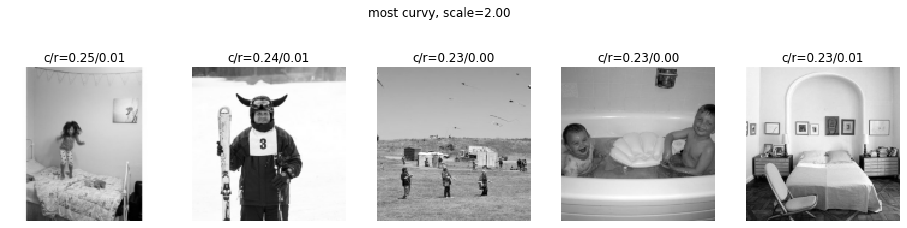

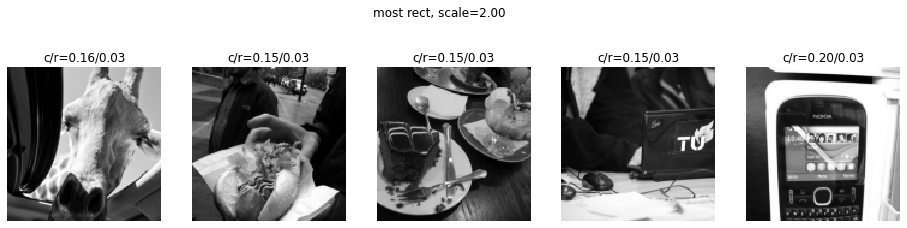

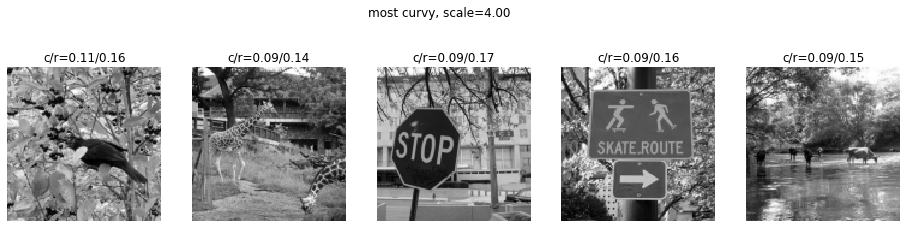

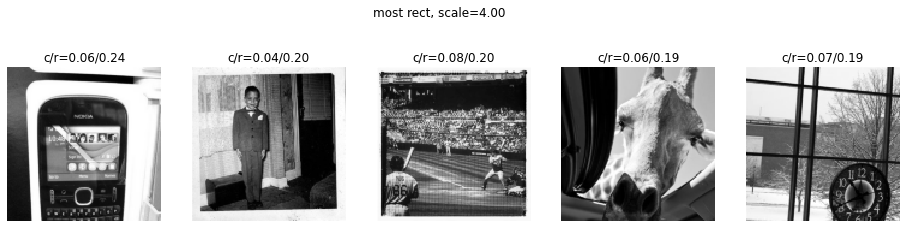

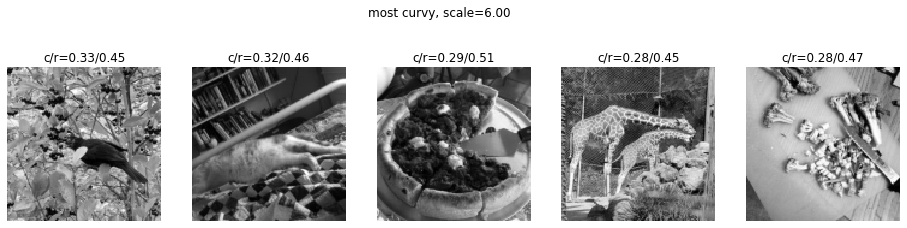

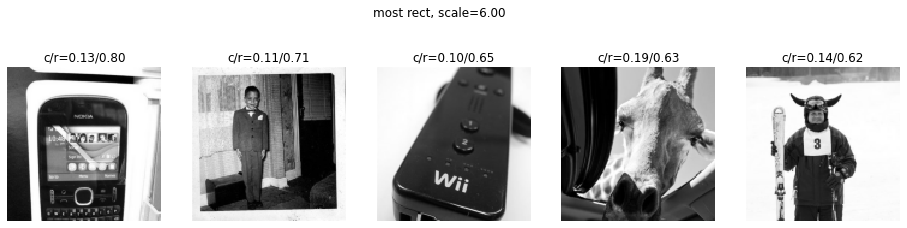

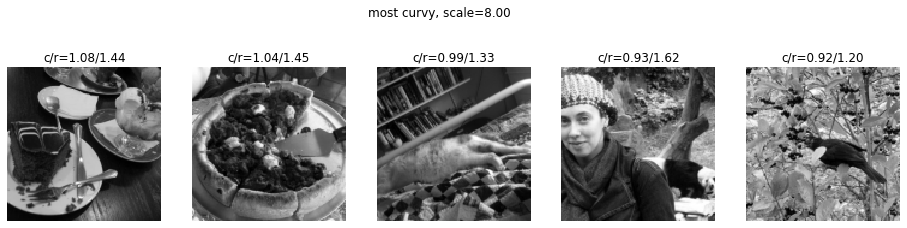

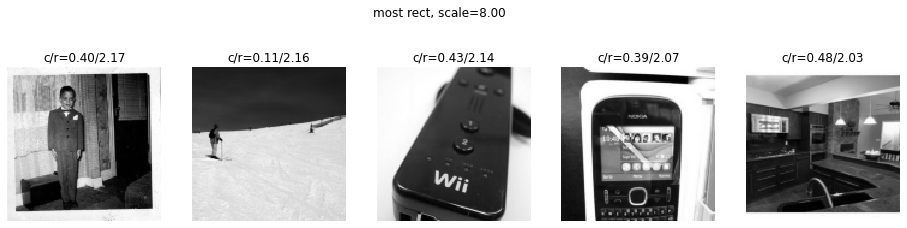

In [91]:
# Plot images sorted by their curviness

for sc in range(len(bank.scale_values)):

    sort_order = np.flip(np.argsort(curv_score_each_scale[:,sc]))[0:5]
    
#     combined_score = (curv_score_each_scale[:,sc] - rect_score_each_scale[:,sc])/ \
#                         (curv_score_each_scale[:,sc] + rect_score_each_scale[:,sc])
#     sort_order = np.flip(np.argsort(combined_score))[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(curv_score_each_scale[ii,sc], \
                                          rect_score_each_scale[ii,sc]))
    plt.suptitle('most curvy, scale=%.2f'%bank.scale_values[sc])

    sort_order = np.flip(np.argsort(rect_score_each_scale[:,sc]))[0:5]
#     sort_order = np.argsort(combined_score)[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(curv_score_each_scale[ii,sc], \
                                          rect_score_each_scale[ii,sc]))

    plt.suptitle('most rect, scale=%.2f'%bank.scale_values[sc])

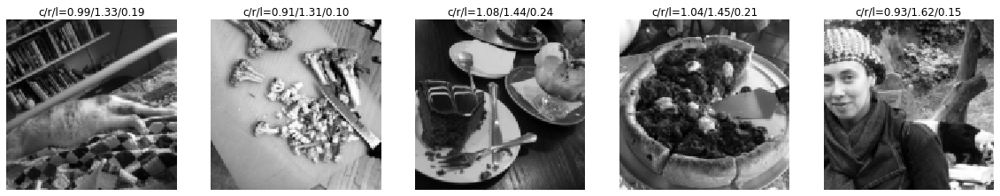

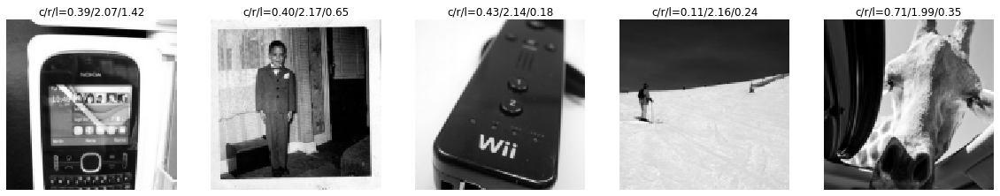

In [94]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(np.mean(curv_score_each_bend, axis=1)))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

    
sort_order = np.flip(np.argsort(np.mean(rect_score_each_bend, axis=1)))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))
    

In [92]:
curv_score_each_bend.shape

(100, 5)

In [87]:
mean_curv_images = np.mean(all_curv_filt_coeffs, axis=2)
mean_rect_images = np.mean(all_rect_filt_coeffs, axis=2)
mean_lin_images = np.mean(all_lin_filt_coeffs, axis=2)

unique_curv_inds = ((mean_curv_images>mean_rect_images) & (mean_curv_images>mean_lin_images))
unique_rect_inds = ((mean_rect_images>mean_curv_images) & (mean_rect_images>mean_lin_images))
unique_lin_inds = ((mean_lin_images>mean_curv_images) & (mean_lin_images>mean_rect_images))

unique_curv_ims = copy.deepcopy(mean_curv_images)
unique_curv_ims[~unique_curv_inds] = 0.0
unique_rect_ims = copy.deepcopy(mean_rect_images)
unique_rect_ims[~unique_rect_inds] = 0.0
unique_lin_ims = copy.deepcopy(mean_lin_images)
unique_lin_ims[~unique_lin_inds] = 0.0

curv_unique_score = np.mean(np.mean(unique_curv_ims, axis=0), axis=0);
rect_unique_score = np.mean(np.mean(unique_rect_ims, axis=0), axis=0);
lin_unique_score = np.mean(np.mean(unique_lin_ims, axis=0), axis=0);

In [87]:
np.corrcoef(curv_score_each_bend.T)

array([[1.        , 0.95938037, 0.87351878, 0.85124788, 0.58536433],
       [0.95938037, 1.        , 0.93645113, 0.90090982, 0.63068855],
       [0.87351878, 0.93645113, 1.        , 0.95666898, 0.67364175],
       [0.85124788, 0.90090982, 0.95666898, 1.        , 0.78677358],
       [0.58536433, 0.63068855, 0.67364175, 0.78677358, 1.        ]])

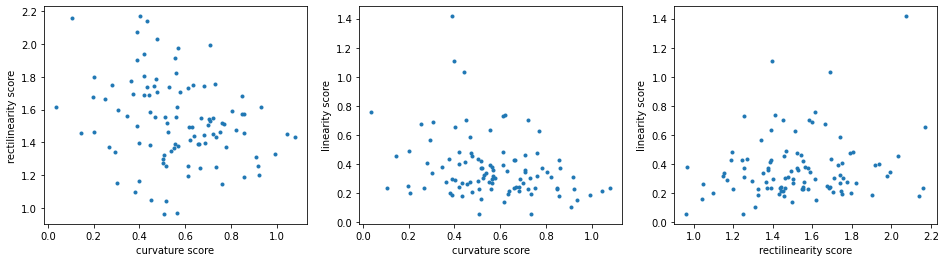

In [17]:
plt.figure(figsize=(16,4));
plt.subplot(1,3,1);
plt.plot(curv_unique_score, rect_unique_score,'.')
plt.xlabel('curvature score');
plt.ylabel('rectilinearity score');
plt.subplot(1,3,2);
plt.plot(curv_unique_score, lin_unique_score,'.')
plt.xlabel('curvature score');
plt.ylabel('linearity score');
plt.subplot(1,3,3);
plt.plot(rect_unique_score, lin_unique_score,'.')
plt.xlabel('rectilinearity score');
plt.ylabel('linearity score');

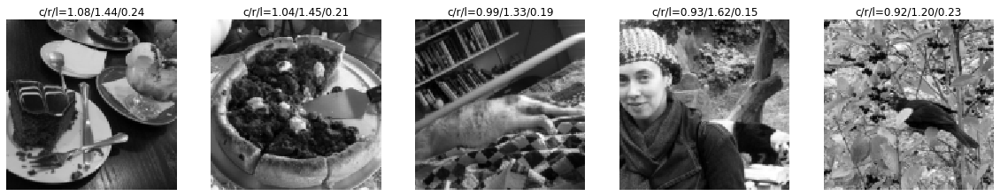

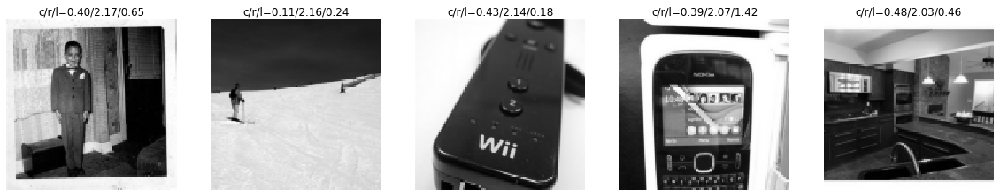

In [84]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(curv_unique_score))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

    
sort_order = np.flip(np.argsort(rect_unique_score))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))
    

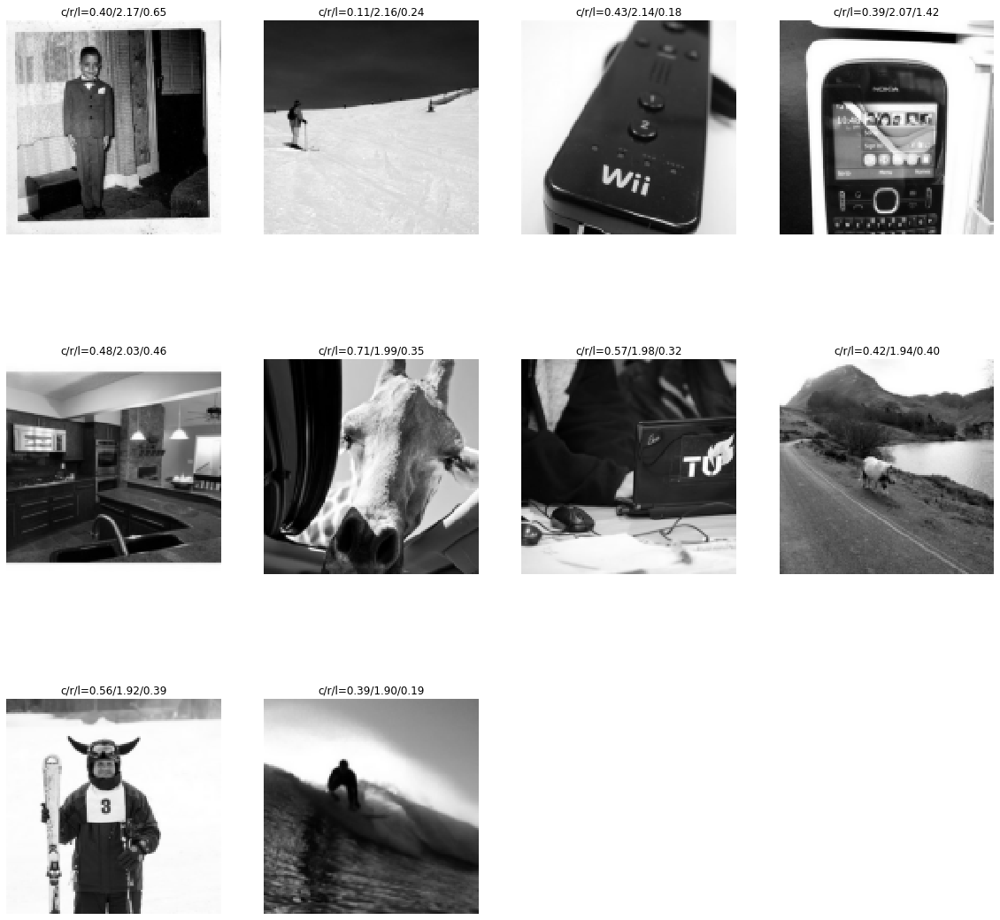

In [19]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(rect_unique_score))[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))
    

In [20]:
sort_order[1]

64

Text(0.5, 1.0, 'unique rect, mean=1.13')

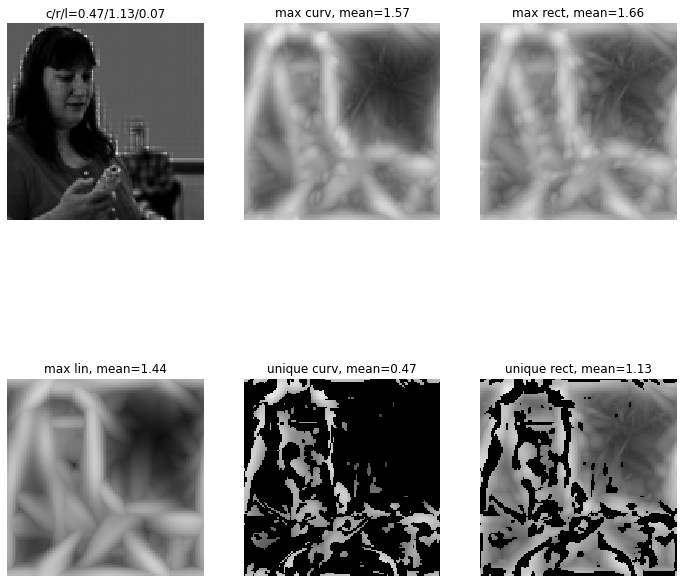

In [84]:
# ii = sort_order[0]
ii = 72
filename = file_list[ii]
image_raw = skio.imread(filename)
image_resized = resize(image_raw, [image_size, image_size])
image_gray = rgb2gray(image_resized)
image_normed = patchnorm(image_gray)

plt.figure(figsize=(12,12))
plt.subplot(2,3,1)
plt.pcolormesh(image_normed,cmap='gray',clim=[0,1])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

plt.subplot(2,3,2)
plt.pcolormesh(max_curv_map[:,:,ii],cmap='gray',vmin=0, vmax=3)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('max curv, mean=%.2f'%(np.mean(max_curv_map[:,:,ii])))

plt.subplot(2,3,3)
plt.pcolormesh(max_rect_map[:,:,ii],cmap='gray',vmin=0, vmax=3)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('max rect, mean=%.2f'%(np.mean(max_rect_map[:,:,ii])))

plt.subplot(2,3,4)
plt.pcolormesh(max_lin_map[:,:,ii],cmap='gray',vmin=0, vmax=3)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('max lin, mean=%.2f'%(np.mean(max_lin_map[:,:,ii])))

plt.subplot(2,3,5)
plt.pcolormesh(unique_curv_ims[:,:,ii],cmap='gray',vmin=0, vmax=3)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('unique curv, mean=%.2f'%(np.mean(unique_curv_ims[:,:,ii])))

plt.subplot(2,3,6)
plt.pcolormesh(unique_rect_ims[:,:,ii],cmap='gray',vmin=0, vmax=3)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('unique rect, mean=%.2f'%(np.mean(unique_rect_ims[:,:,ii])))


Text(0.5, 1.0, 'unique rect, mean=0.07')

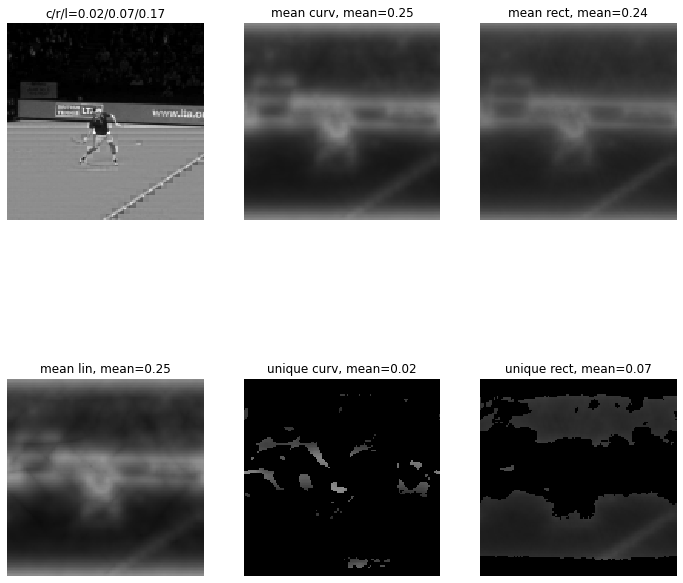

In [92]:
# ii = sort_order[7]
ii = 72

filename = file_list[ii]
image_raw = skio.imread(filename)
image_resized = resize(image_raw, [image_size, image_size])
image_gray = rgb2gray(image_resized)
image_normed = patchnorm(image_gray)

plt.figure(figsize=(12,12))
plt.subplot(2,3,1)
plt.pcolormesh(image_normed,cmap='gray',clim=[0,1])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

plt.subplot(2,3,2)
plt.pcolormesh(mean_curv_images[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('mean curv, mean=%.2f'%(np.mean(mean_curv_map[:,:,ii])))

plt.subplot(2,3,3)
plt.pcolormesh(mean_rect_images[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('mean rect, mean=%.2f'%(np.mean(mean_rect_map[:,:,ii])))

plt.subplot(2,3,4)
plt.pcolormesh(mean_lin_images[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('mean lin, mean=%.2f'%(np.mean(mean_lin_map[:,:,ii])))

plt.subplot(2,3,5)
plt.pcolormesh(unique_curv_ims[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('unique curv, mean=%.2f'%(np.mean(unique_curv_ims[:,:,ii])))

plt.subplot(2,3,6)
plt.pcolormesh(unique_rect_ims[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('unique rect, mean=%.2f'%(np.mean(unique_rect_ims[:,:,ii])))


Text(0.5, 1.0, 'unique rect, mean=1.29')

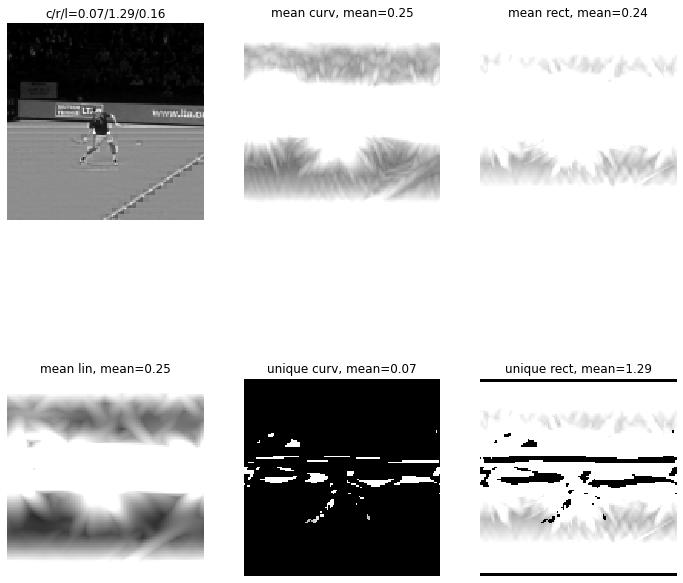

In [95]:
# ii = sort_order[7]
ii = 72

filename = file_list[ii]
image_raw = skio.imread(filename)
image_resized = resize(image_raw, [image_size, image_size])
image_gray = rgb2gray(image_resized)
image_normed = patchnorm(image_gray)

plt.figure(figsize=(12,12))
plt.subplot(2,3,1)
plt.pcolormesh(image_normed,cmap='gray',clim=[0,1])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_unique_score[ii], rect_unique_score[ii], lin_unique_score[ii]))

plt.subplot(2,3,2)
plt.pcolormesh(max_curv_images[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('mean curv, mean=%.2f'%(np.mean(mean_curv_map[:,:,ii])))

plt.subplot(2,3,3)
plt.pcolormesh(max_rect_images[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('mean rect, mean=%.2f'%(np.mean(mean_rect_map[:,:,ii])))

plt.subplot(2,3,4)
plt.pcolormesh(max_lin_images[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('mean lin, mean=%.2f'%(np.mean(mean_lin_map[:,:,ii])))

plt.subplot(2,3,5)
plt.pcolormesh(unique_curv_ims[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('unique curv, mean=%.2f'%(np.mean(unique_curv_ims[:,:,ii])))

plt.subplot(2,3,6)
plt.pcolormesh(unique_rect_ims[:,:,ii],cmap='gray',vmin=0, vmax=1)
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('unique rect, mean=%.2f'%(np.mean(unique_rect_ims[:,:,ii])))


In [77]:
max_curv_map.shape

(128, 128, 100)

In [36]:
import scipy.stats

n_scales = len(bank.scale_values)
n_bends = len(bank.bend_values)
n_orients = len(bank.orient_values)

mean_curv = np.mean(np.mean(np.mean(all_curv_filt_coeffs, axis=0),axis=0), axis=0)
# mean_curv_over_space = np.mean(np.mean(all_curv_filt_coeffs, axis=0), axis=0)

# curv_z = scipy.stats.zscore(all_curv_filt_coeffs, axis=3)
# curv_score = np.mean(np.mean(curv_z, axis=0),axis=0)

# curv_z = scipy.stats.zscore(mean_curv_over_space, axis=1)
# curv_score = np.mean(curv_z, axis=0)

# max_curv_map = np.max(all_curv_filt_coeffs, axis=2)
# mean_curv_map = np.mean(all_curv_filt_coeffs, axis=2)
# coeff_each_prop_curv = np.reshape(np.mean(np.mean(all_curv_filt_coeffs, axis=0), axis=0), \
#                             [n_scales, n_bends-1, n_orients, n_images])
# max_curv_map_each_scale = np.mean(np.mean(coeff_each_prop_curv, axis=1), axis=1)

mean_rect = np.mean(np.mean(np.mean(all_rect_filt_coeffs, axis=0),axis=0), axis=0)
# mean_rect_over_space = np.mean(np.mean(all_rect_filt_coeffs, axis=0), axis=0)
# rect_z = scipy.stats.zscore(all_rect_filt_coeffs, axis=3)
# rect_score = np.mean(np.mean(rect_z, axis=0),axis=0)

# rect_z = scipy.stats.zscore(mean_rect_over_space, axis=1)
# rect_score = np.mean(rect_z, axis=0)

# max_rect_map = np.max(all_rect_filt_coeffs, axis=2)
# mean_rect_map = np.mean(all_rect_filt_coeffs, axis=2)
# coeff_each_prop_rect = np.reshape(np.mean(np.mean(all_rect_filt_coeffs, axis=0), axis=0), \
#                             [n_scales, n_bends-1, n_orients, n_images])
# max_rect_map_each_scale = np.mean(np.mean(coeff_each_prop_rect, axis=1), axis=1)

mean_lin = np.mean(np.mean(np.mean(all_lin_filt_coeffs, axis=0),axis=0), axis=0)
# mean_lin_over_space = np.mean(np.mean(all_lin_filt_coeffs, axis=0), axis=0)
# lin_z = scipy.stats.zscore(all_lin_filt_coeffs, axis=3)
# lin_score = np.mean(np.mean(lin_z, axis=0),axis=0)

# lin_z = scipy.stats.zscore(mean_lin_over_space, axis=1)
# lin_score = np.mean(lin_z, axis=0)

# max_lin_map = np.max(all_lin_filt_coeffs, axis=2)
# mean_lin_map = np.mean(all_lin_filt_coeffs, axis=2)
# coeff_each_prop_lin = np.reshape(np.mean(np.mean(all_lin_filt_coeffs, axis=0), axis=0), \
#                             [n_scales, 1, n_orients, n_images])
# max_lin_map_each_scale = np.mean(np.mean(coeff_each_prop_lin, axis=1), axis=1)

# which_max = np.argmax(np.array([max_curv_map, max_rect_map, max_lin_map]), axis=0)

curv_score = (mean_curv-mean_rect)/(mean_curv+mean_rect)
rect_score = (mean_rect-mean_curv)/(mean_curv+mean_rect)

bend_score = (mean_lin - mean_curv - mean_rect)/(mean_lin+mean_curv+mean_rect)

In [31]:
# curv_score = np.mean(curv_score, axis=0)
# rect_score = np.mean(rect_score, axis=0)
# lin_score = np.mean(lin_score, axis=0)

In [32]:
# curv_score_adj = curv_score/(rect_score+lin_score)
# rect_score_adj = rect_score/(curv_score+lin_score)
# lin_score_adj = lin_score/(curv_score+rect_score)

# curv_score_adj = (curv_score-(rect_score+lin_score))/(curv_score+rect_score+lin_score)
# rect_score_adj = (rect_score-(curv_score+lin_score))/(curv_score+rect_score+lin_score)
# lin_score_adj = (lin_score-(curv_score+rect_score))/(curv_score+rect_score+lin_score)

# curv_score_adj = (curv_score-rect_score)/(curv_score+rect_score+lin_score)
# rect_score_adj = (rect_score-curv_score)/(curv_score+rect_score+lin_score)

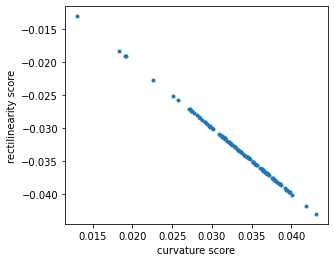

In [33]:
plt.figure(figsize=(16,4));
plt.subplot(1,3,1);
plt.plot(curv_score, rect_score,'.')
plt.xlabel('curvature score');
plt.ylabel('rectilinearity score');
# plt.subplot(1,3,2);
# plt.plot(curv_score_adj, lin_score_adj,'.')
# plt.xlabel('curvature score');
# plt.ylabel('linearity score');
# plt.subplot(1,3,3);
# plt.plot(rect_score_adj, lin_score_adj,'.')
# plt.xlabel('rectilinearity score');
# plt.ylabel('linearity score');

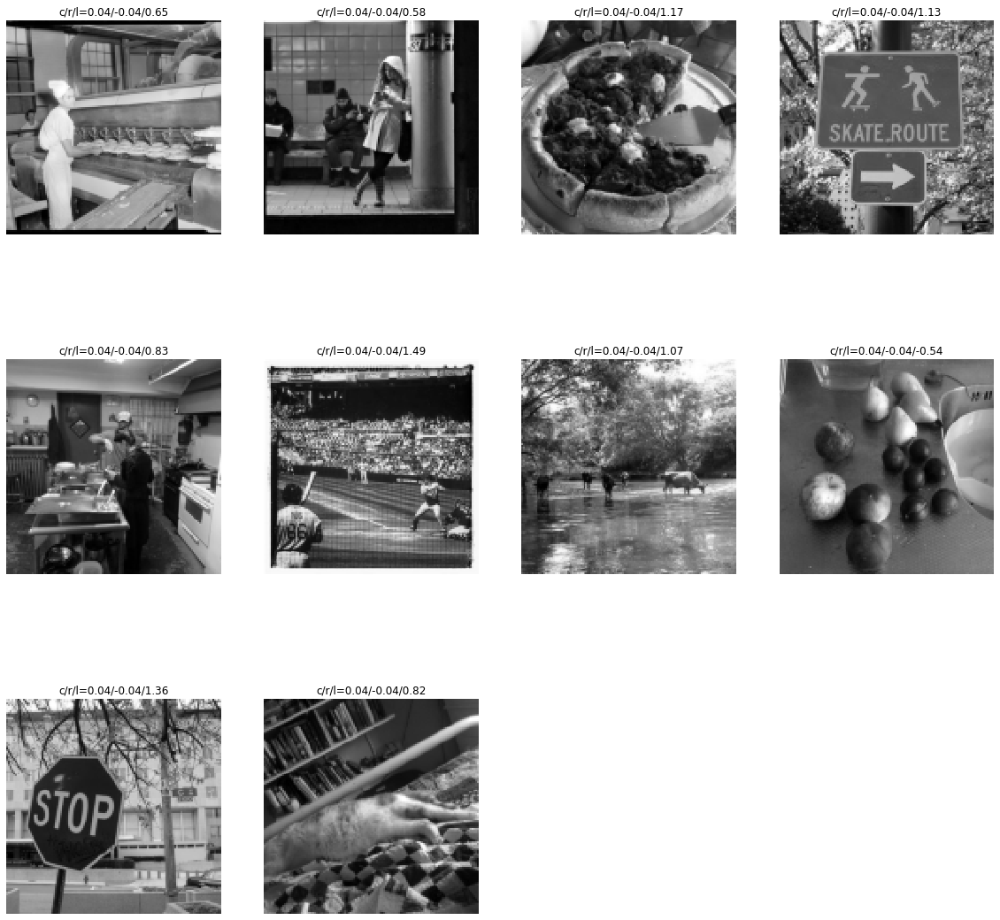

In [34]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(curv_score))[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

In [ ]:
ii

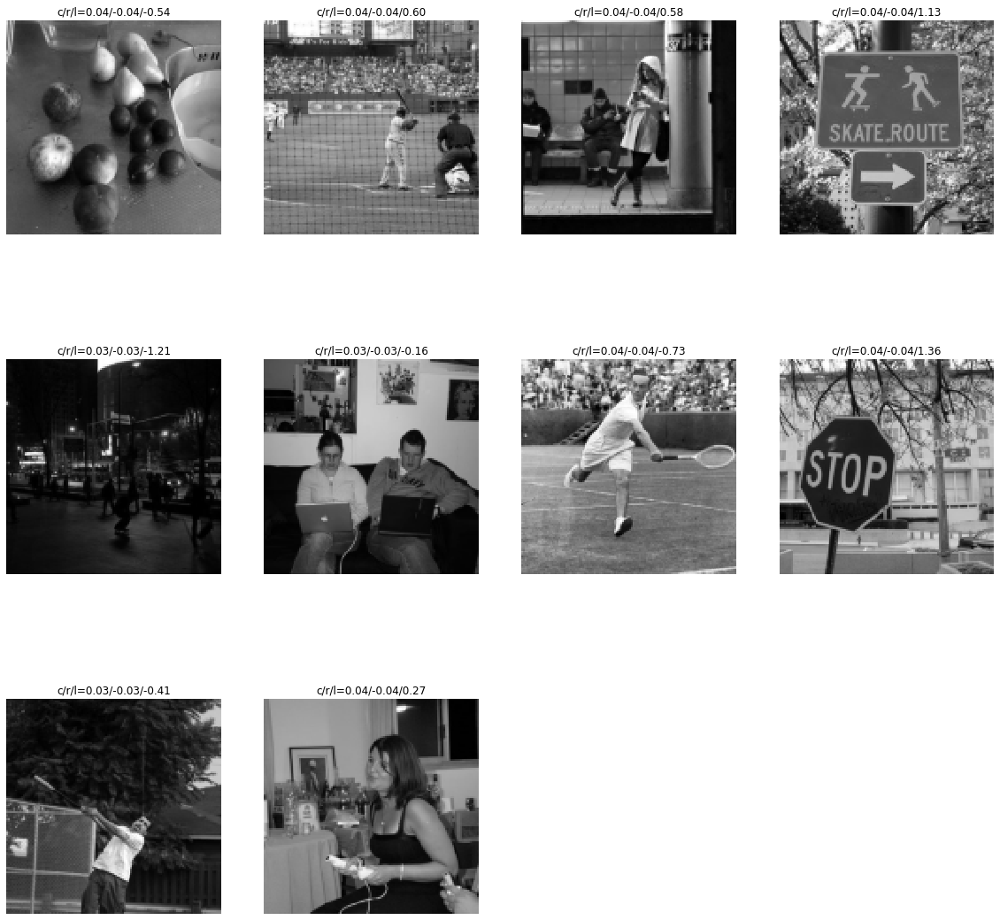

In [39]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(bend_score))[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

76

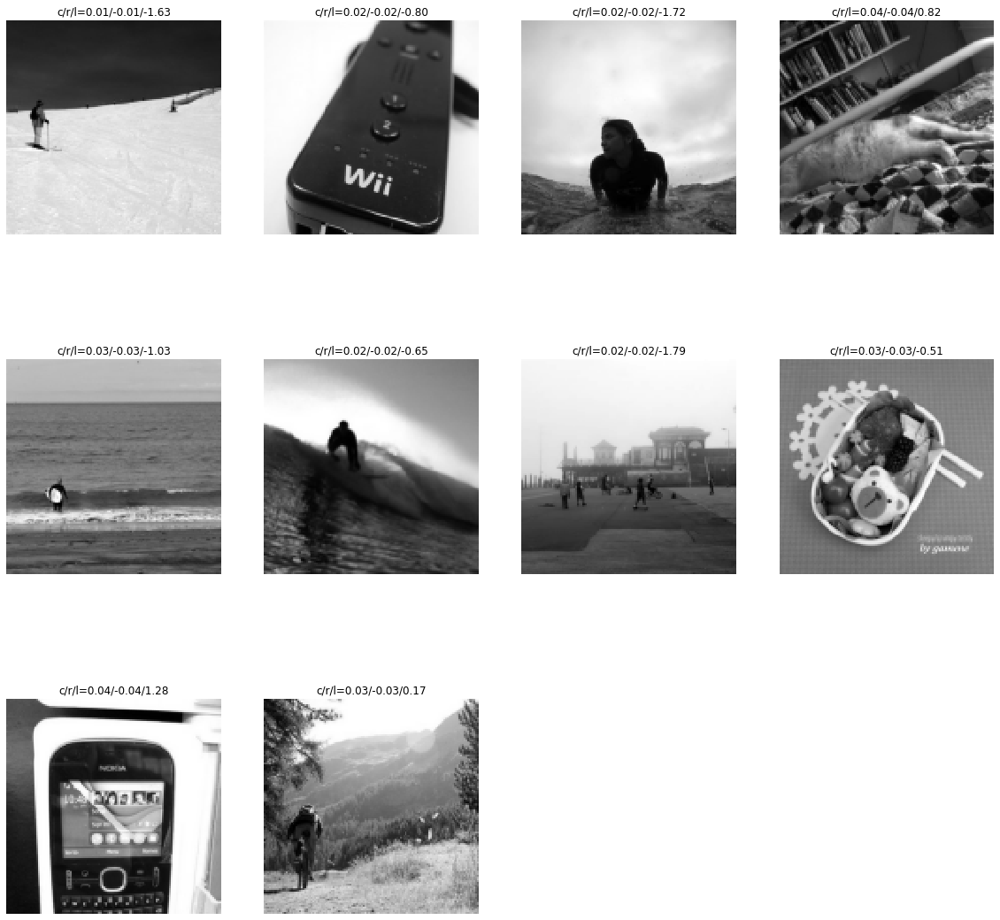

In [38]:
# Plot images sorted by their curviness

sort_order = np.argsort(bend_score)[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

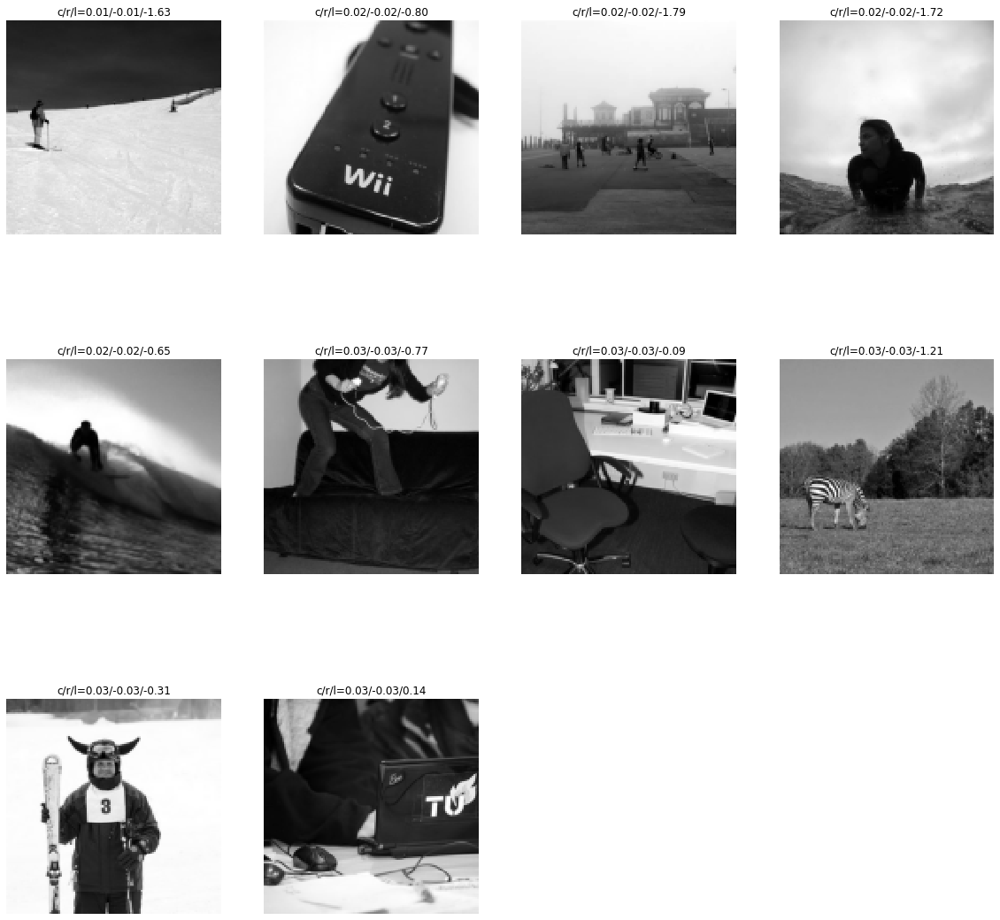

In [35]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(rect_score))[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

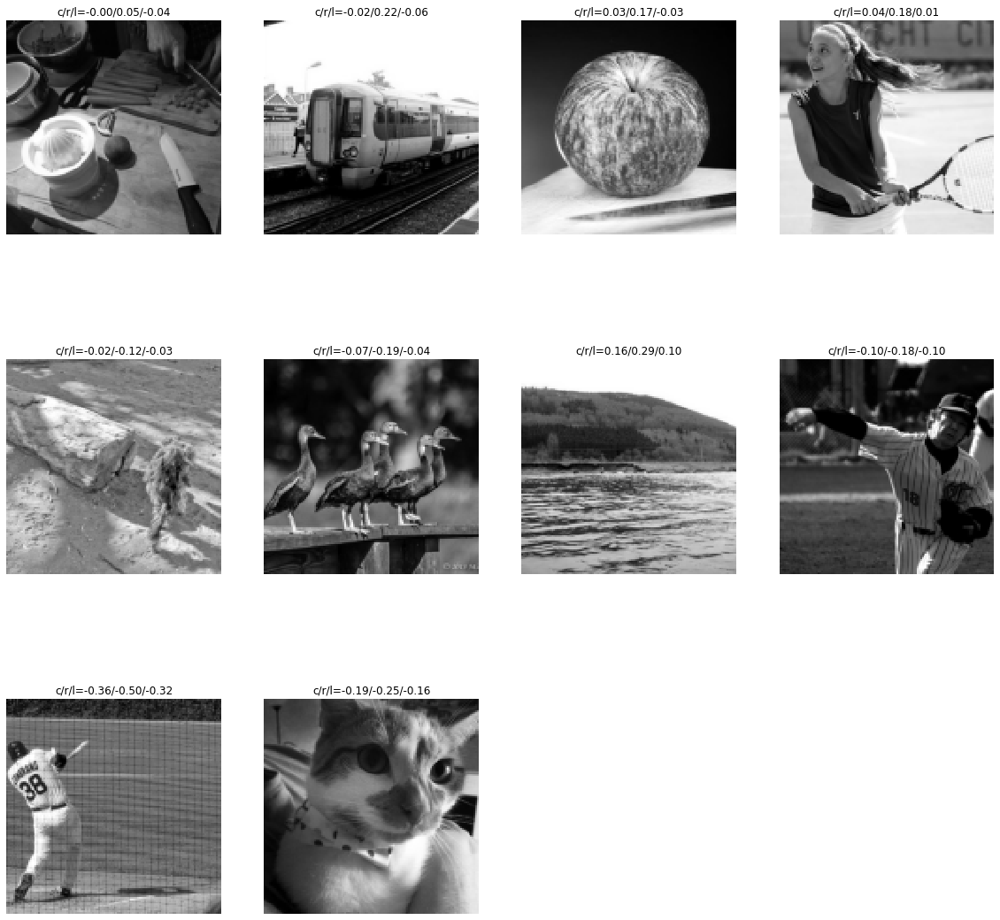

In [49]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(rect_score_adj))[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

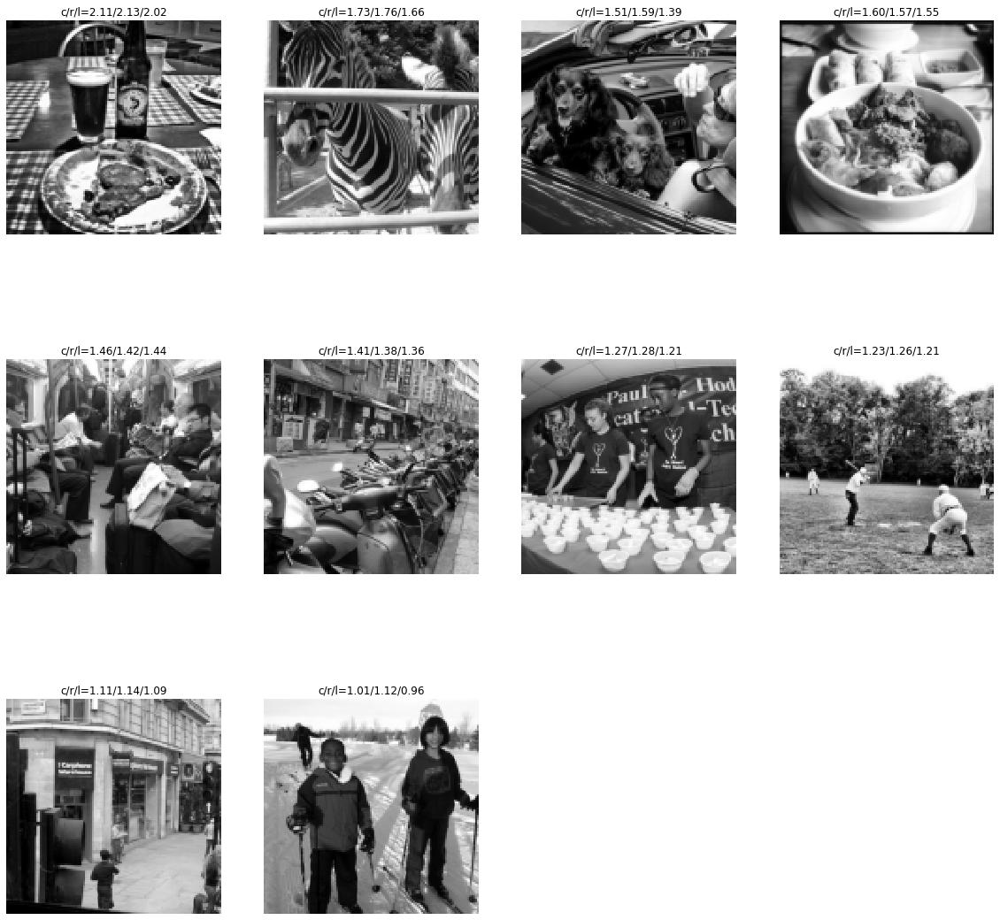

In [24]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(rect_score))[0:10]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)

    plt.subplot(3,4,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

In [13]:
np.min(max_curv_map_this)

2.9131923033300167

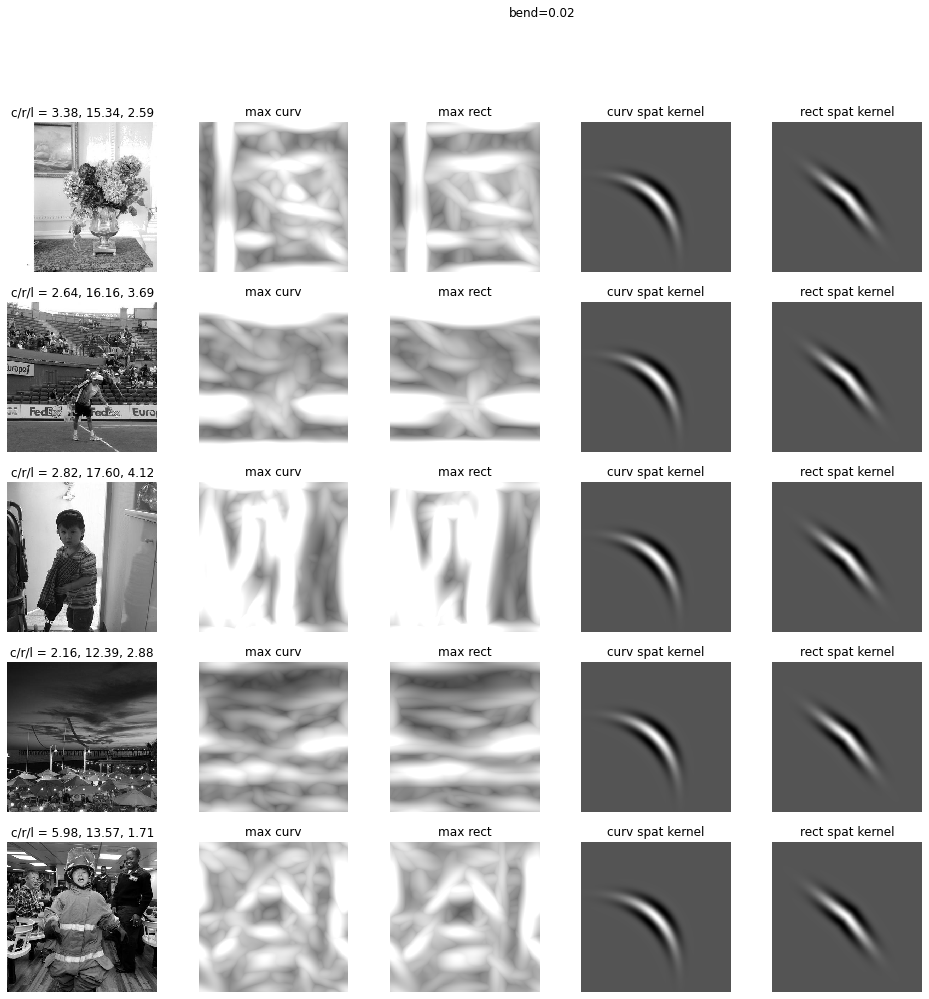

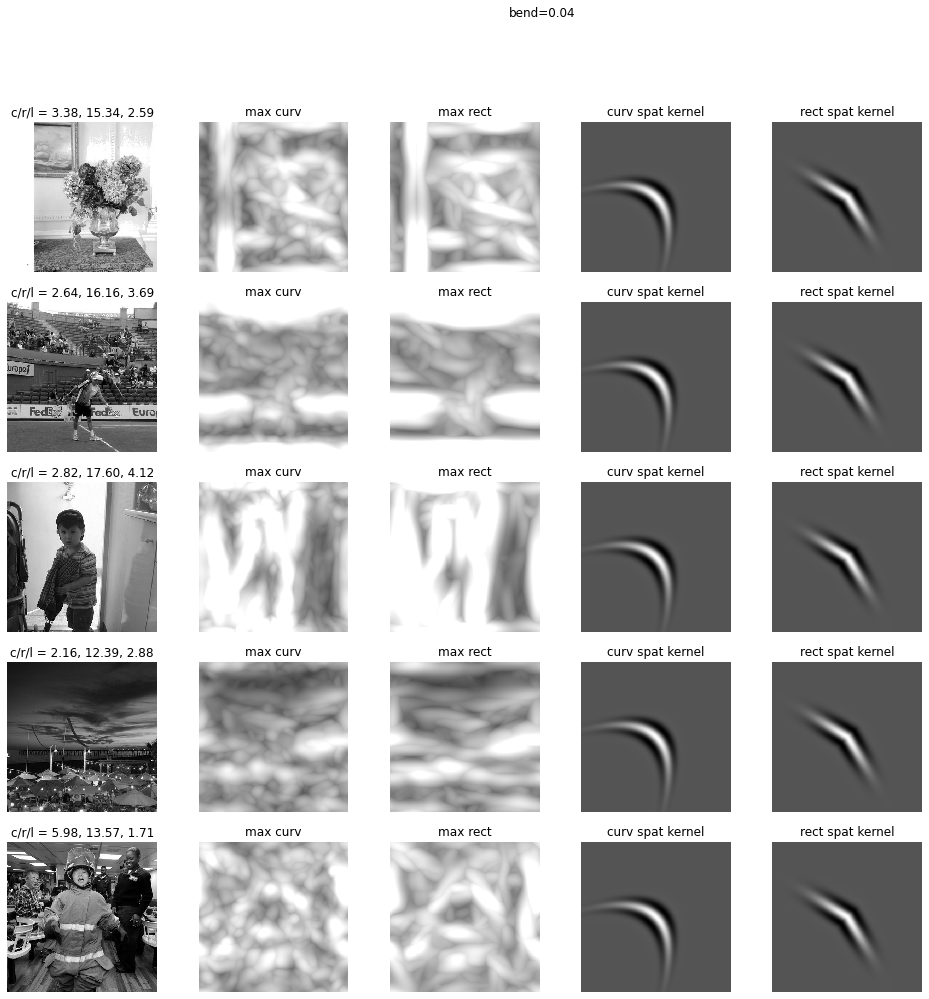

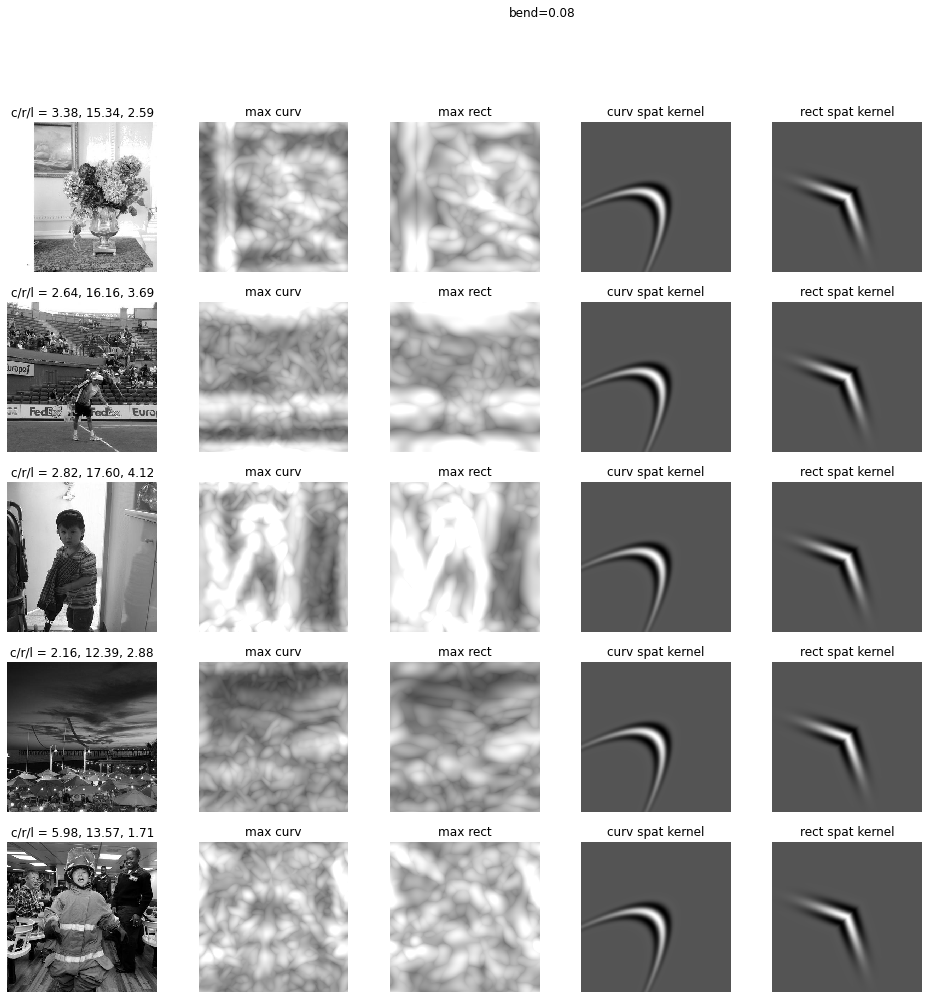

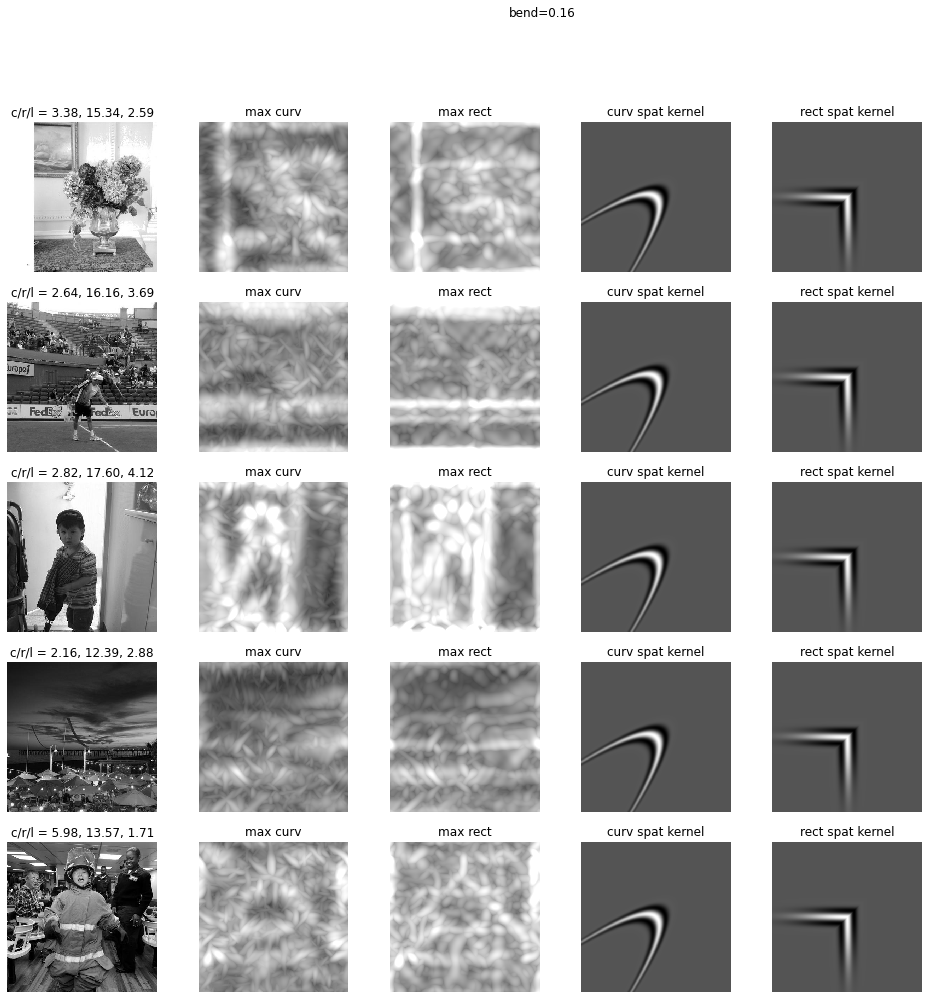

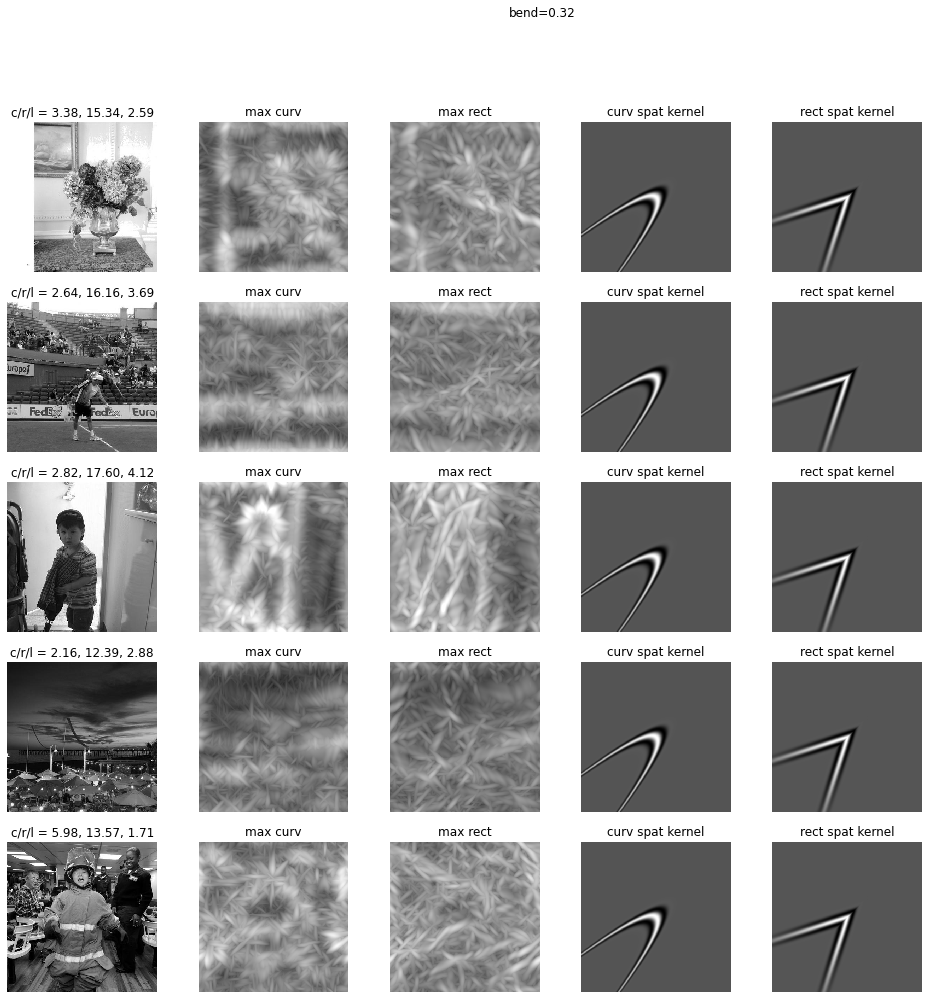

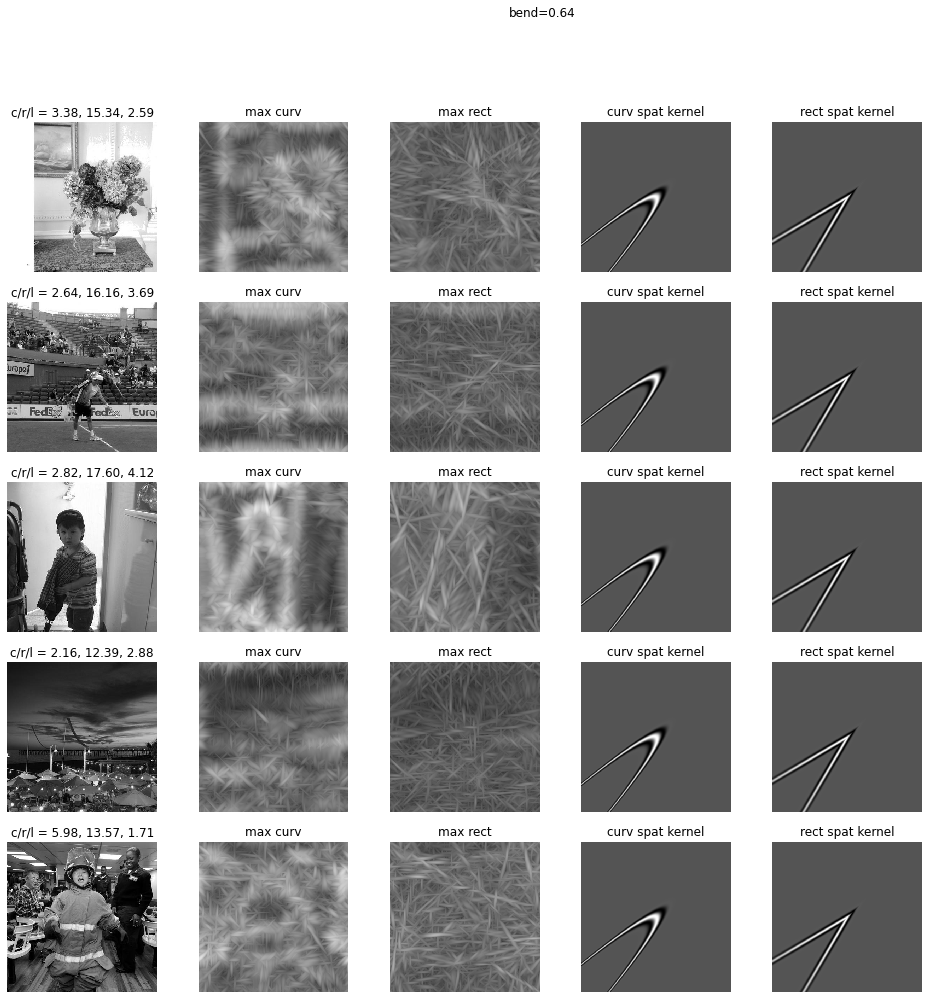

In [14]:

# combined_score = curv_unique_score/(rect_unique_score+lin_unique_score)
combined_score = rect_unique_score/(curv_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
       
vmax = 25
 
for bb in bank.bend_values[1:]:
    
    plt.figure(figsize=(20,16));
    pi=0

    kernel_inds = bank.curv_kernel_pars[:,1]==bb
    max_curv_map_this = np.max(all_curv_filt_coeffs[:,:,kernel_inds,:], axis=2)
    max_rect_map_this = np.max(all_rect_filt_coeffs[:,:,kernel_inds,:], axis=2)

    for ii in ims2plot:

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        pi+=1
        plt.subplot(len(ims2plot),6,pi);
        plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                              rect_unique_score[ii], \
                                              lin_unique_score[ii]))
        plt.axis('off')

        pi+=1
        plt.subplot(len(ims2plot),6,pi);
        plt.pcolormesh(max_curv_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max curv')
        plt.axis('off')

        pi+=1
        plt.subplot(len(ims2plot),6,pi);
        plt.pcolormesh(max_rect_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max rect')
        plt.axis('off')

        
        pi+=1
        plt.subplot(len(ims2plot),6,pi);
        
        spat_kernel = bank.kernels['curv_space'][np.where(kernel_inds)[0][-1]]
        
        plt.pcolormesh(np.real(spat_kernel), cmap='gray')
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('curv spat kernel')
        plt.axis('off')
        
        
        pi+=1
        plt.subplot(len(ims2plot),6,pi);
        
        spat_kernel = bank.kernels['rect_space'][np.where(kernel_inds)[0][-1]]
        
        plt.pcolormesh(np.real(spat_kernel), cmap='gray')
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('rect spat kernel')
        plt.axis('off')

        

        pi+=1

    plt.suptitle('bend=%.2f'%bb)

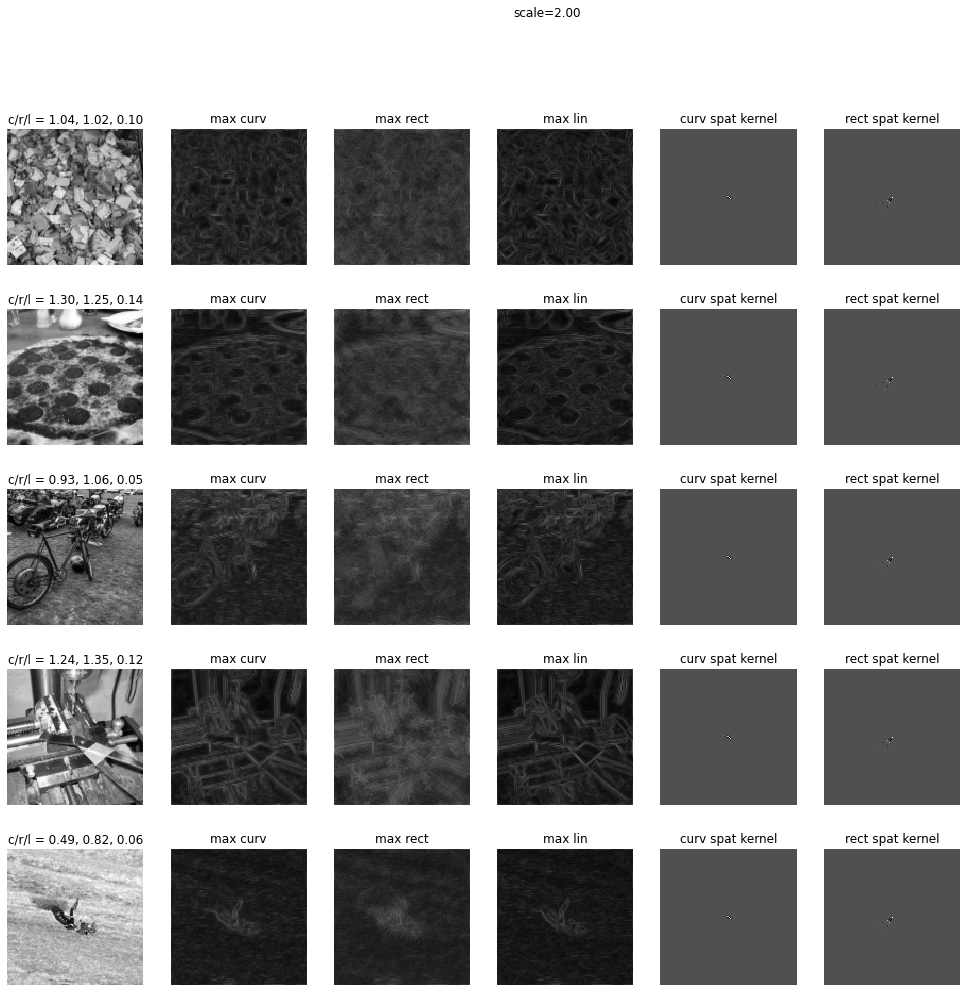

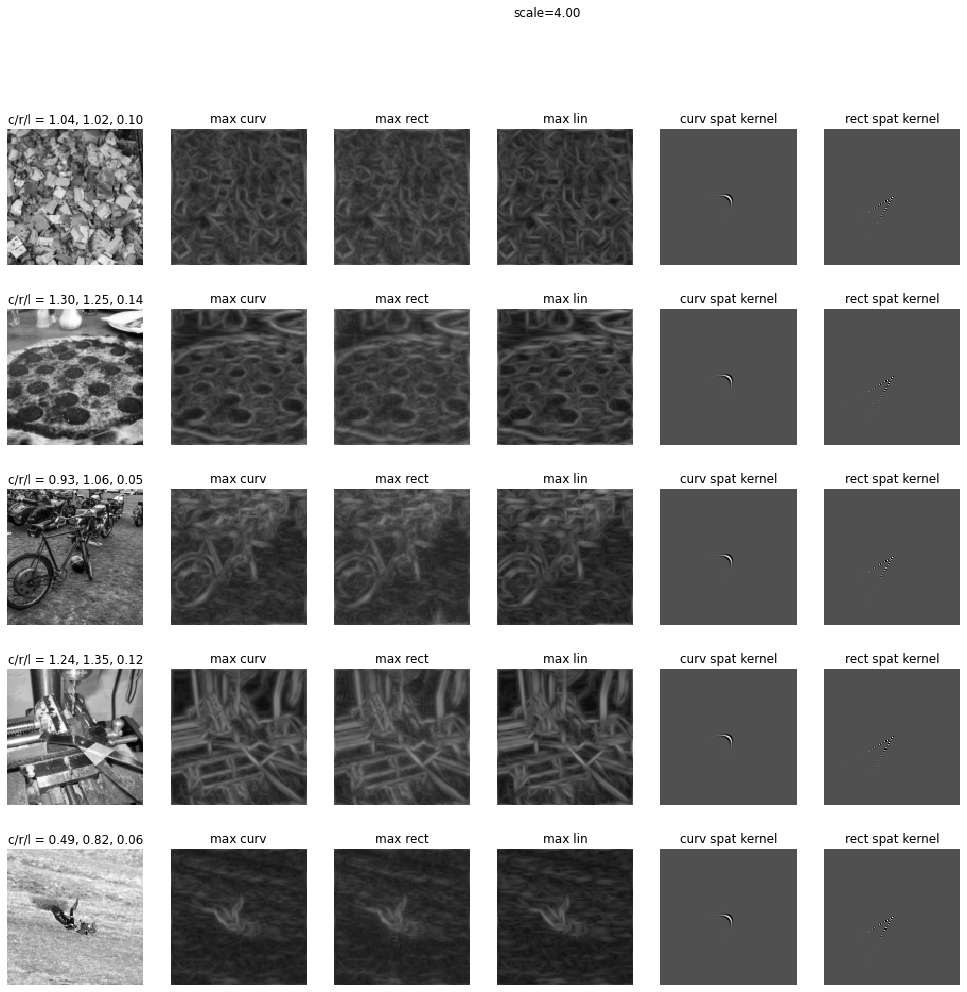

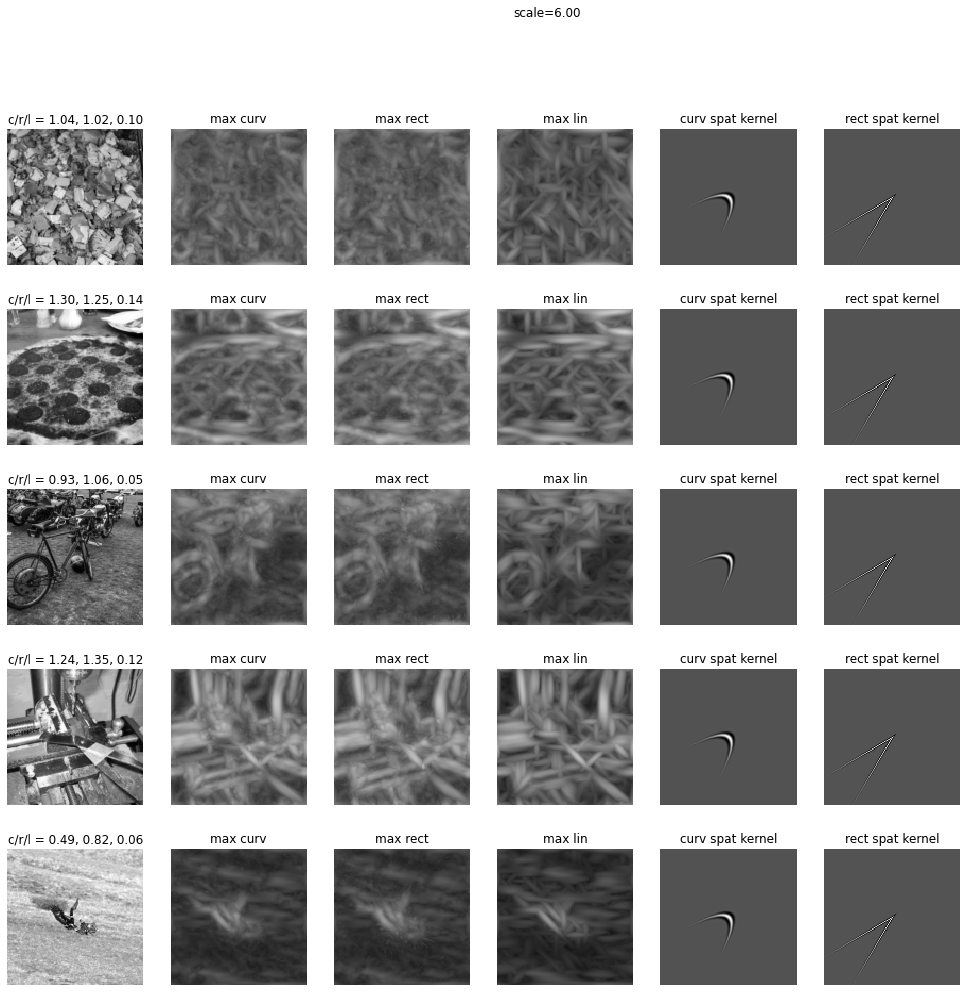

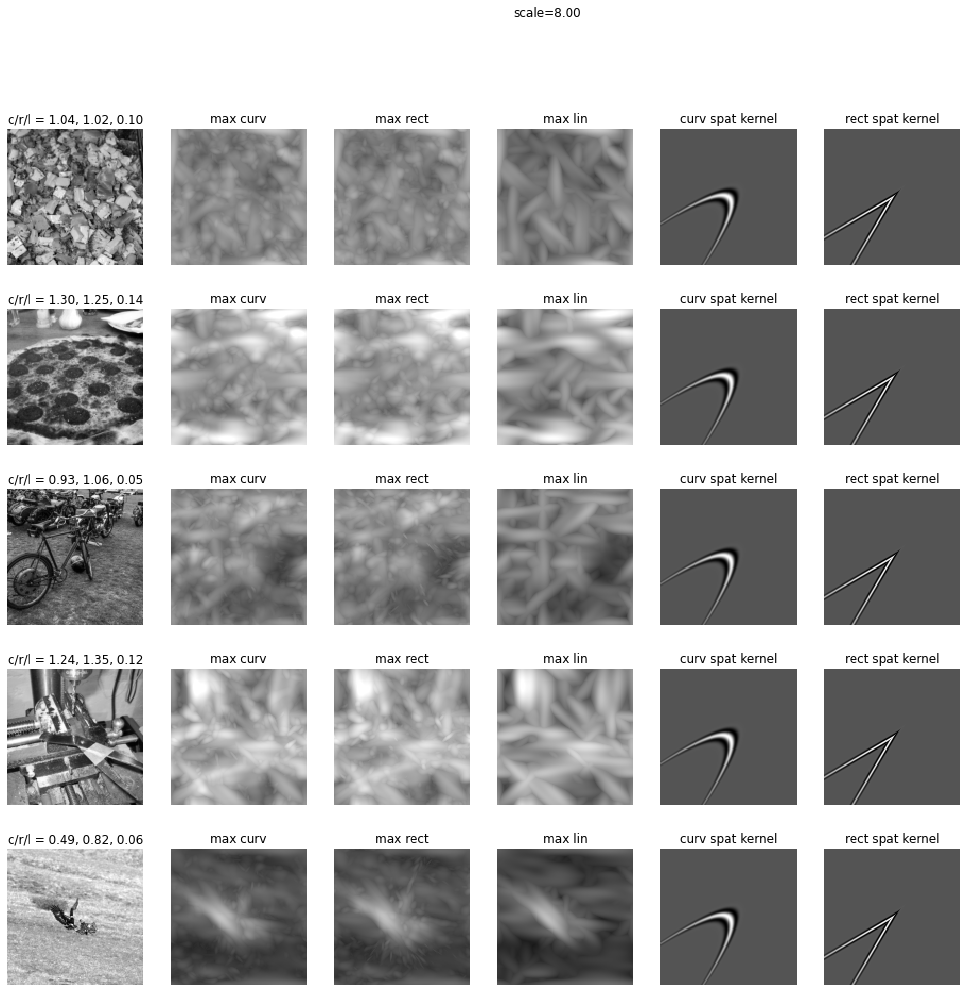

In [98]:

combined_score = curv_unique_score-(rect_unique_score+lin_unique_score)
# combined_score = rect_unique_score/(curv_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
       
vmaxes = [0.5, 1, 2, 4]
 
for sci, sc in enumerate(bank.scale_values):
    
    vmax = vmaxes[sci]
    
    plt.figure(figsize=(20,16));
    pi=0

    kernel_inds = bank.curv_kernel_pars[:,0]==sc
    max_curv_map_this = np.max(all_curv_filt_coeffs[:,:,kernel_inds,:], axis=2)
    max_rect_map_this = np.max(all_rect_filt_coeffs[:,:,kernel_inds,:], axis=2)
    lin_kernel_inds = bank.lin_kernel_pars[:,0]==sc
    max_lin_map_this = np.max(all_lin_filt_coeffs[:,:,lin_kernel_inds,:], axis=2)

    for ii in ims2plot:

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                              rect_unique_score[ii], \
                                              lin_unique_score[ii]))
        plt.axis('off')

        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(max_curv_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max curv')
        plt.axis('off')

        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(max_rect_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max rect')
        plt.axis('off')
        
        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(max_lin_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max lin')
        plt.axis('off')

        
        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        
        spat_kernel = bank.kernels['curv_space'][np.where(kernel_inds)[0][-1]]
        
        plt.pcolormesh(np.real(spat_kernel), cmap='gray')
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('curv spat kernel')
        plt.axis('off')
        
        
        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        
        spat_kernel = bank.kernels['rect_space'][np.where(kernel_inds)[0][-1]]
        
        plt.pcolormesh(np.real(spat_kernel), cmap='gray')
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('rect spat kernel')
        plt.axis('off')

        

        pi+=1

    plt.suptitle('scale=%.2f'%sc)

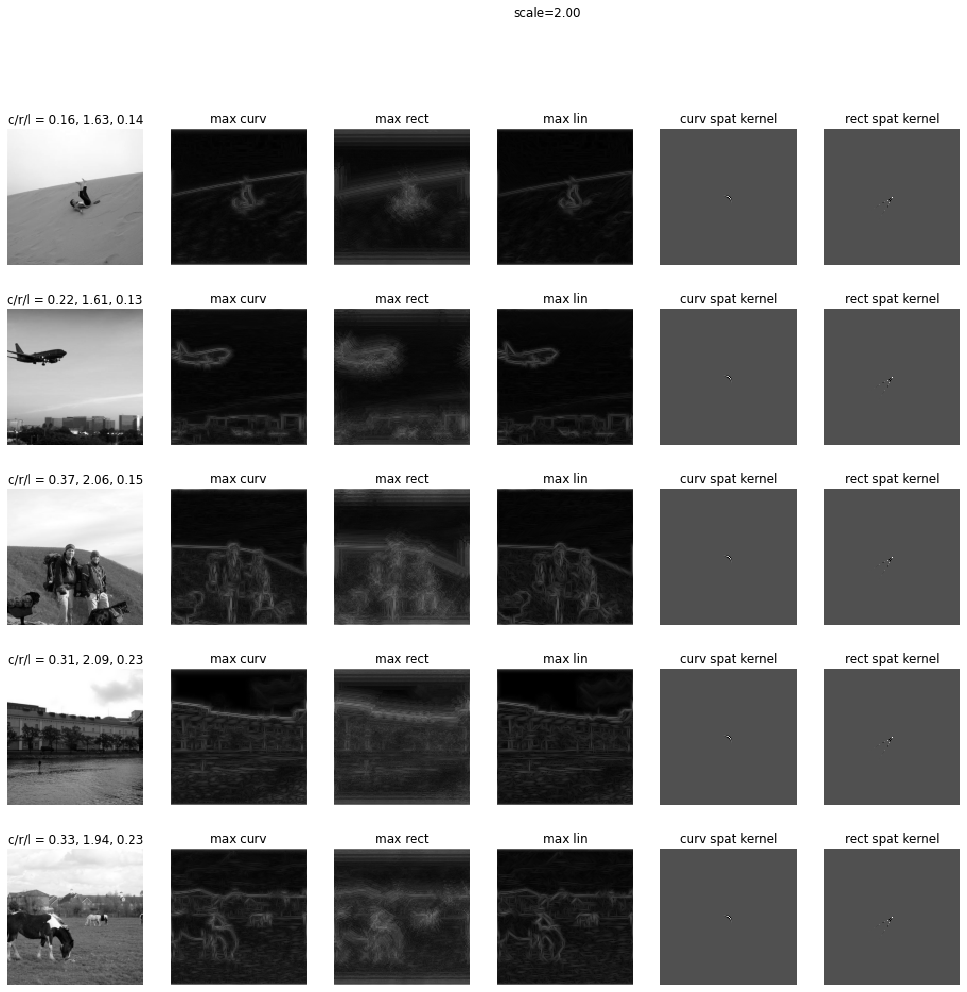

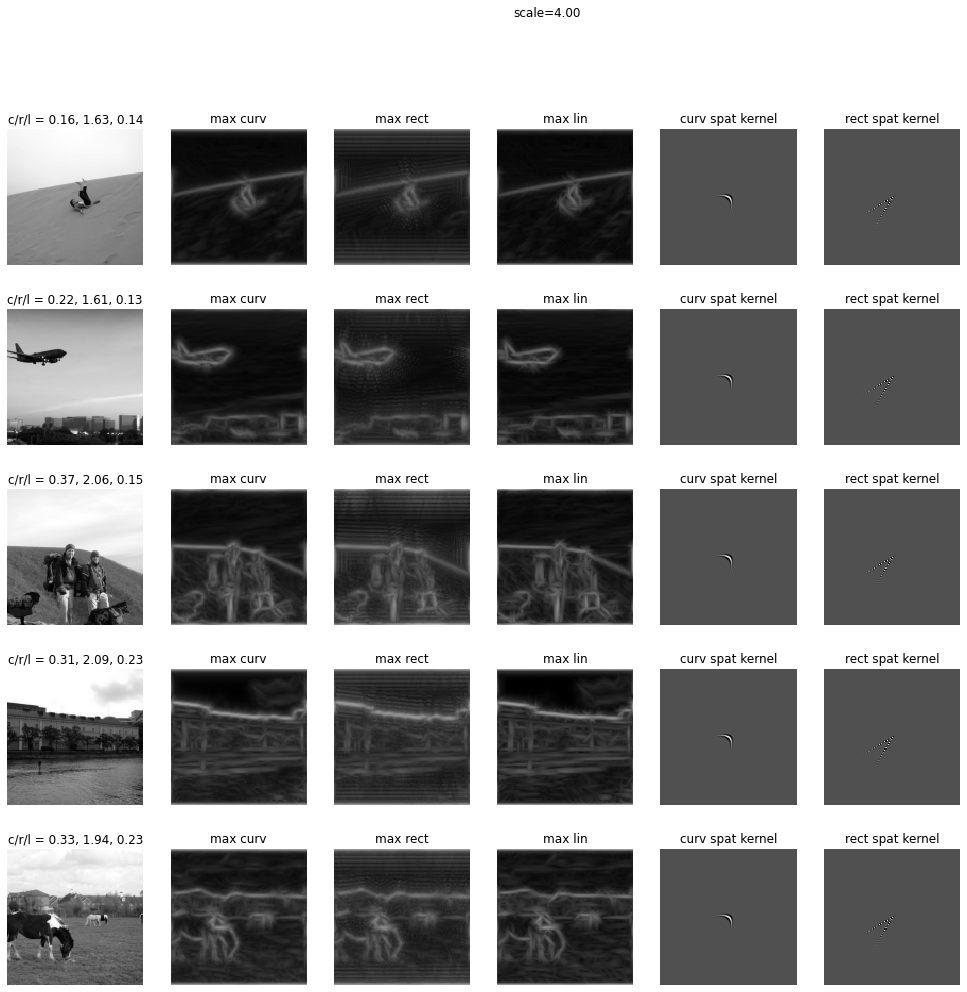

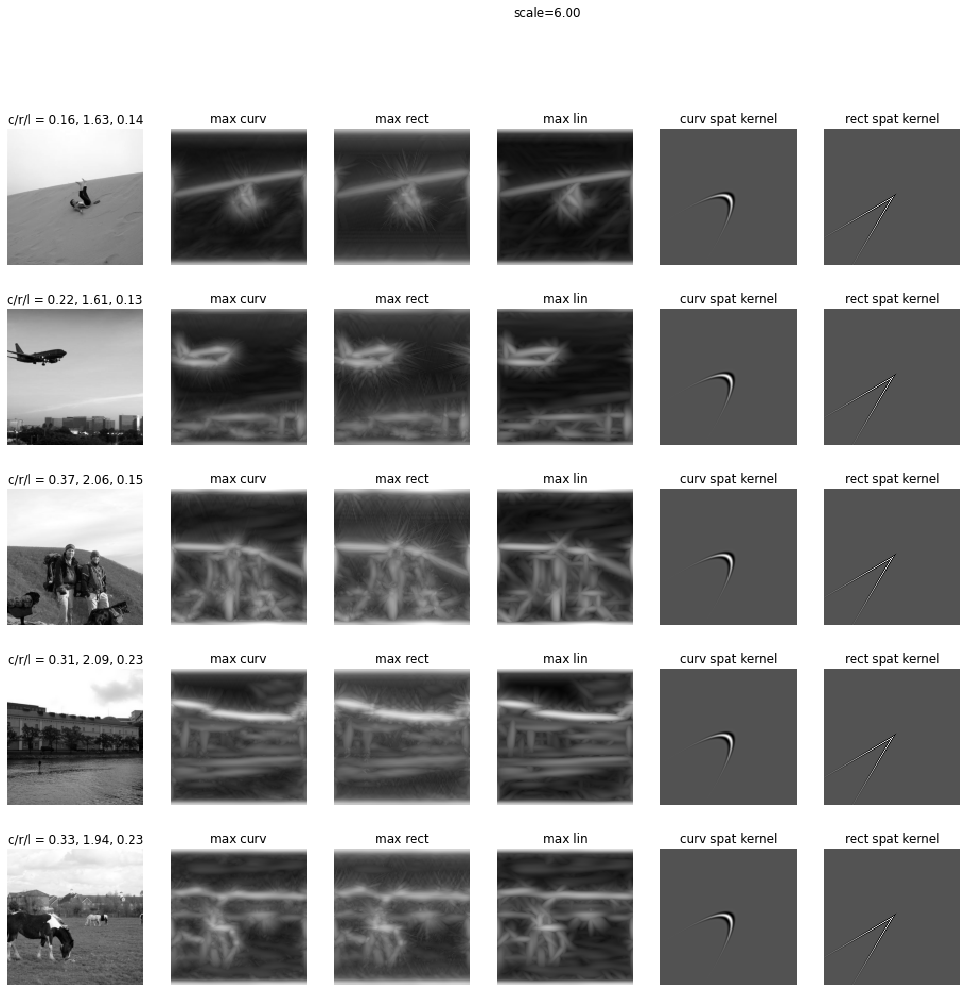

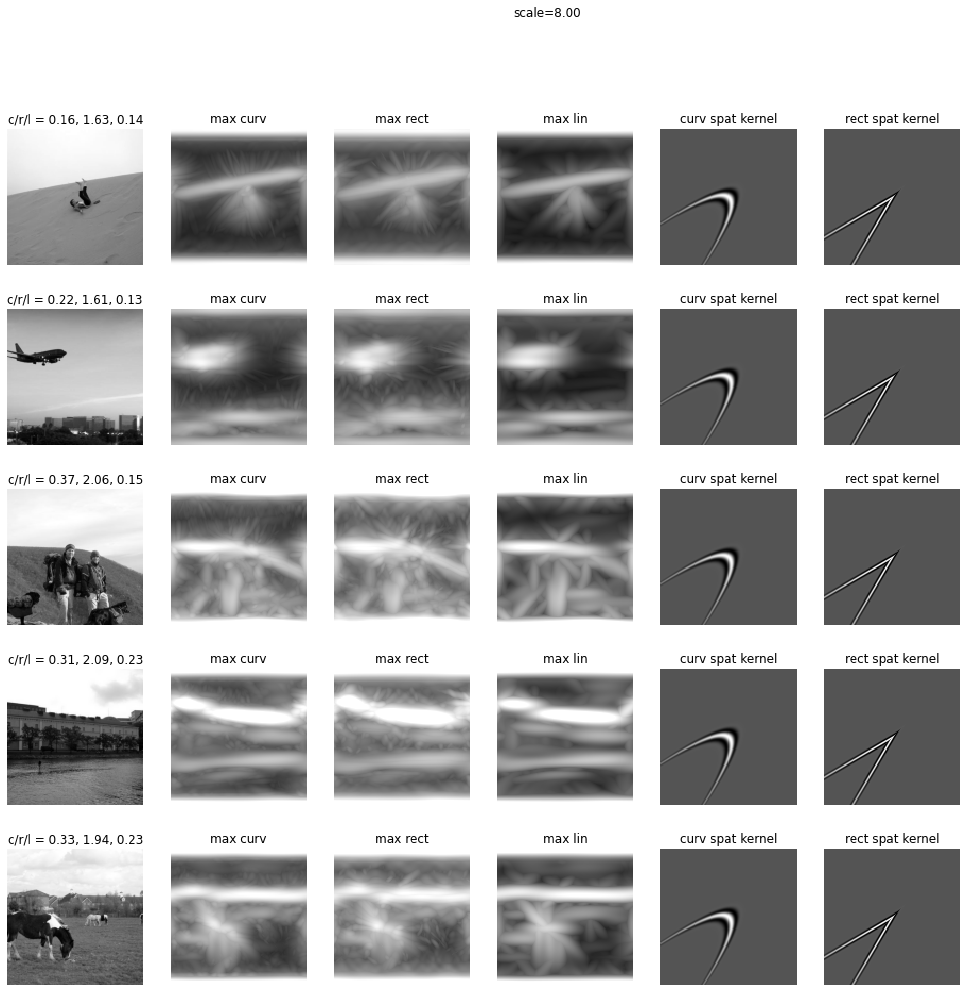

In [84]:


combined_score = rect_unique_score/(curv_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
       
vmaxes = [0.5, 1, 2, 4]
 
for sci, sc in enumerate(bank.scale_values):
    
    vmax = vmaxes[sci]
    
    plt.figure(figsize=(20,16));
    pi=0

    kernel_inds = bank.curv_kernel_pars[:,0]==sc
    max_curv_map_this = np.max(all_curv_filt_coeffs[:,:,kernel_inds,:], axis=2)
    max_rect_map_this = np.max(all_rect_filt_coeffs[:,:,kernel_inds,:], axis=2)
    lin_kernel_inds = bank.lin_kernel_pars[:,0]==sc
    max_lin_map_this = np.max(all_lin_filt_coeffs[:,:,lin_kernel_inds,:], axis=2)

    for ii in ims2plot:

        filename = file_list[ii]
        image_raw = skio.imread(filename)
        image_resized = resize(image_raw, [image_size, image_size])
        image_gray = rgb2gray(image_resized)

        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                              rect_unique_score[ii], \
                                              lin_unique_score[ii]))
        plt.axis('off')

        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(max_curv_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max curv')
        plt.axis('off')

        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(max_rect_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max rect')
        plt.axis('off')
        
        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        plt.pcolormesh(max_lin_map_this[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('max lin')
        plt.axis('off')

        
        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        
        spat_kernel = bank.kernels['curv_space'][np.where(kernel_inds)[0][-1]]
        
        plt.pcolormesh(np.real(spat_kernel), cmap='gray')
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('curv spat kernel')
        plt.axis('off')
        
        
        pi+=1
        plt.subplot(len(ims2plot),7,pi);
        
        spat_kernel = bank.kernels['rect_space'][np.where(kernel_inds)[0][-1]]
        
        plt.pcolormesh(np.real(spat_kernel), cmap='gray')
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.title('rect spat kernel')
        plt.axis('off')

        

        pi+=1

    plt.suptitle('scale=%.2f'%sc)

(0.0, 128.0, 128.0, 0.0)

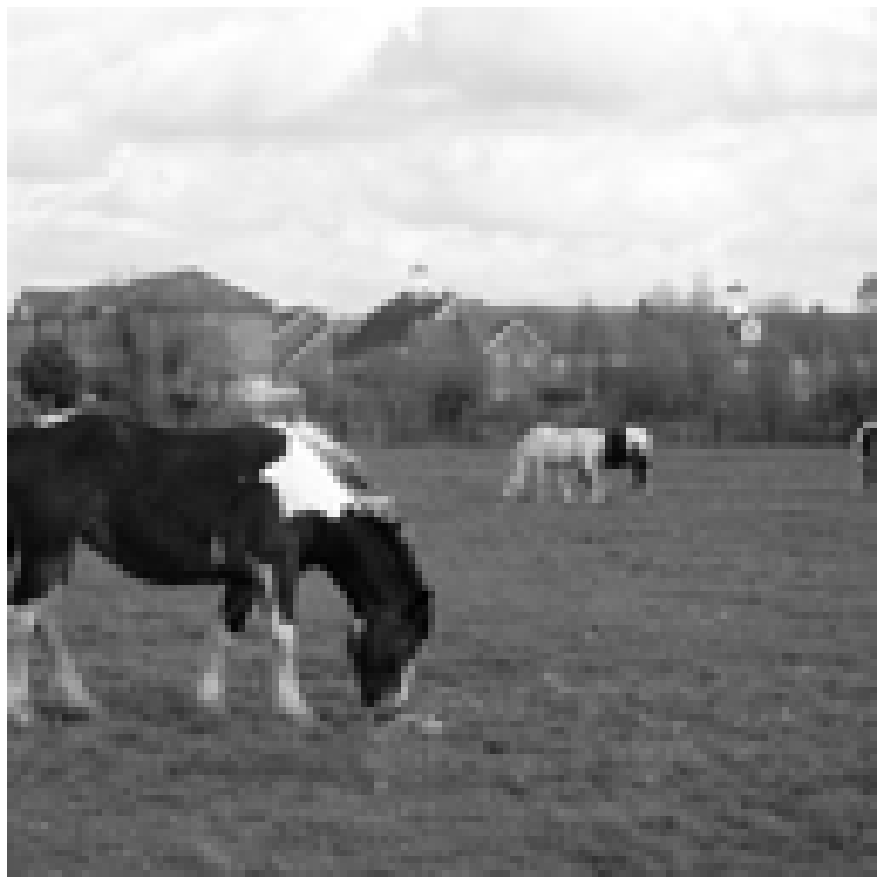

In [94]:
from PIL import Image
import PIL.ImageOps

plt.figure(figsize=(16,16));
image_raw = Image.open(filename)
# image_raw = skio.imread(filename)
image_resized = image_raw.resize([image_size, image_size], )
# image_resized = resize(image_raw, [image_size, image_size])
# image_gray = rgb2gray(image_raw)
image_gray = PIL.ImageOps.grayscale(image_resized)

plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')

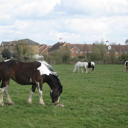

In [92]:
image_resized

In [31]:
curr_batch=4
ims2plot = np.arange(curr_batch*batch_size, curr_batch*batch_size+5)
inds_into_batch = ims2plot - curr_batch*batch_size
inds_into_batch

array([0, 1, 2, 3, 4])

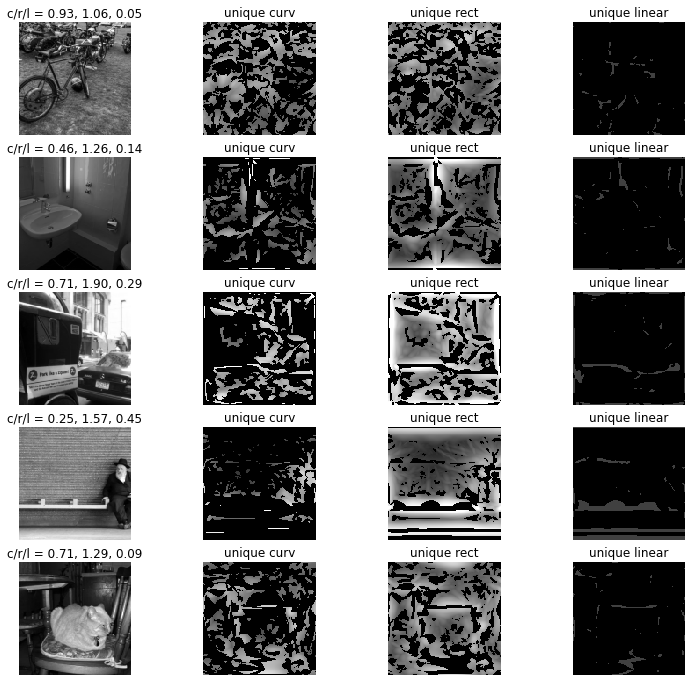

In [35]:
plt.figure(figsize=(16,12));
pi=0

curr_batch=4
ims2plot = np.arange(curr_batch*batch_size, curr_batch*batch_size+5)
inds_into_batch = ims2plot - curr_batch*batch_size

vmax = 4.0

for ii,bi in zip(ims2plot, inds_into_batch):
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_list[bi], cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                          rect_unique_score[ii], \
                                          lin_unique_score[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_curv_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_rect_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_lin_inds[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique linear')
    plt.axis('off')
    
    pi+=1


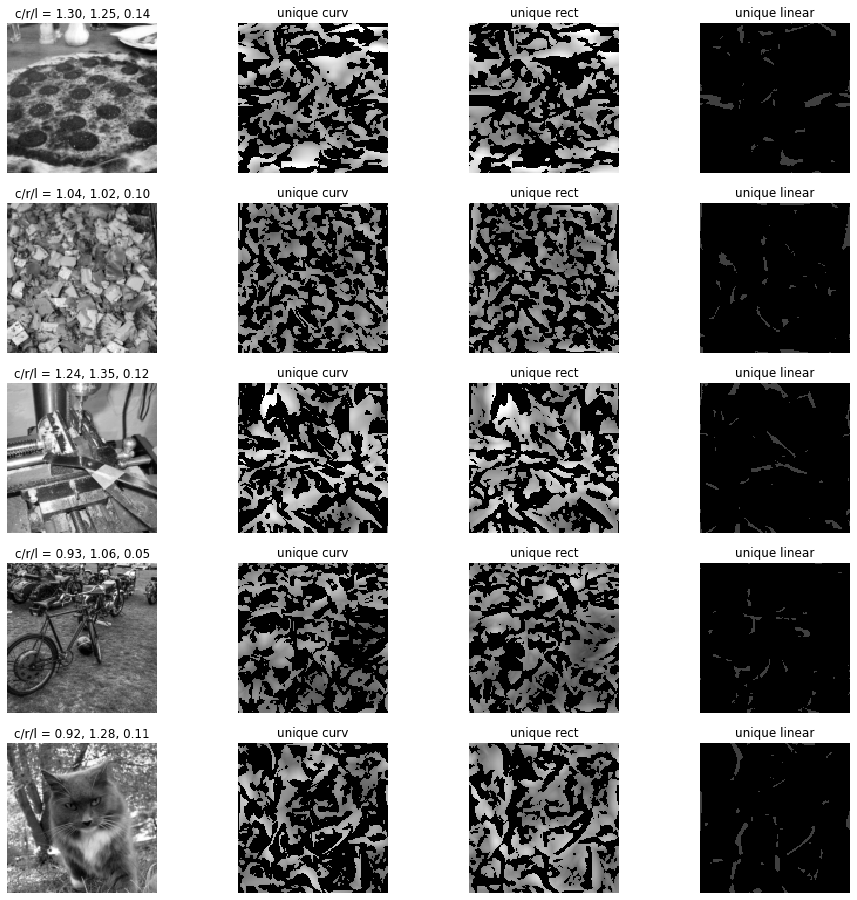

In [46]:
plt.figure(figsize=(20,16));
pi=0

# ims2plot = np.flip(np.argsort(curv_unique_score))[0:5]
combined_score = curv_unique_score/(rect_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
    
vmax = 4.0

for ii in ims2plot:
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                          rect_unique_score[ii], \
                                          lin_unique_score[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_curv_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_rect_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_lin_inds[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique linear')
    plt.axis('off')
    
    pi+=1


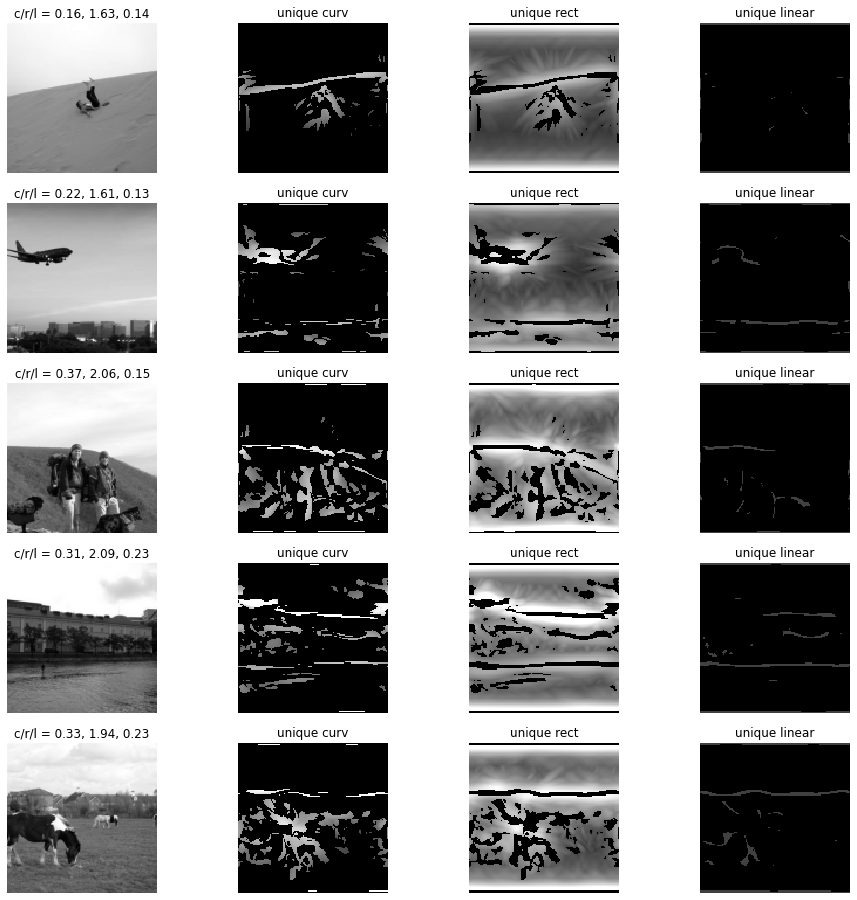

In [47]:
plt.figure(figsize=(20,16));
pi=0

# ims2plot = np.flip(np.argsort(curv_unique_score))[0:5]
combined_score = rect_unique_score/(curv_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
    
vmax = 4.0

for ii in ims2plot:
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                          rect_unique_score[ii], \
                                          lin_unique_score[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_curv_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_rect_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_lin_inds[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique linear')
    plt.axis('off')
    
    pi+=1


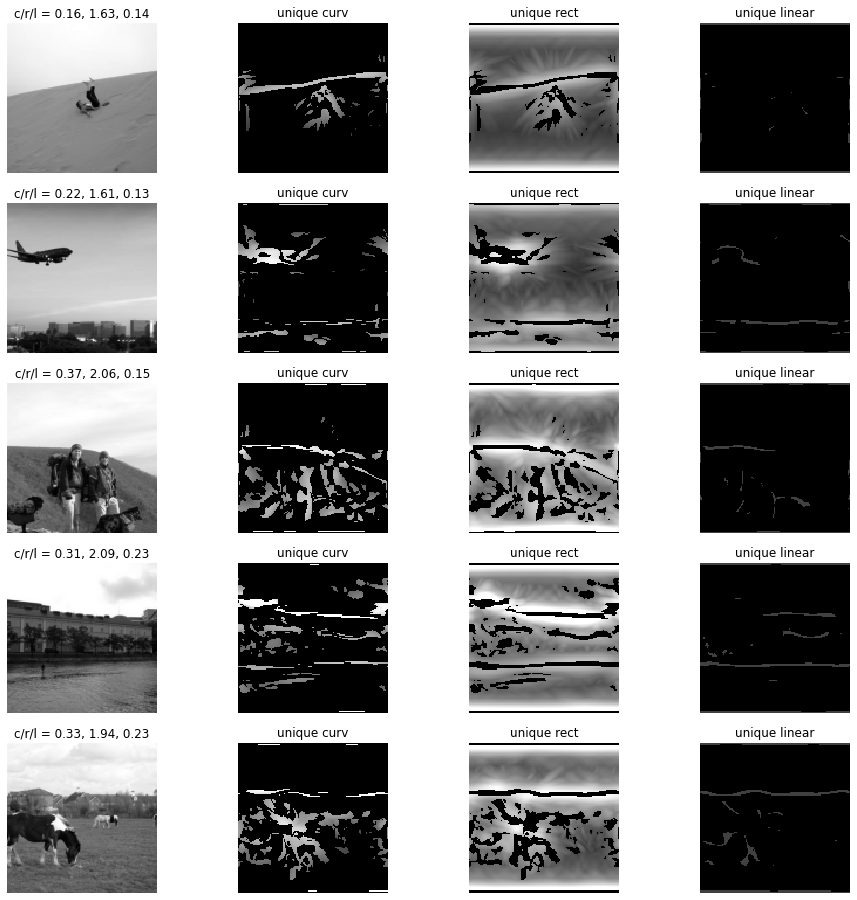

In [47]:
plt.figure(figsize=(20,16));
pi=0

# ims2plot = np.flip(np.argsort(curv_unique_score))[0:5]
combined_score = rect_unique_score/(curv_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
    
vmax = 4.0

for ii in ims2plot:
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                          rect_unique_score[ii], \
                                          lin_unique_score[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_curv_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_rect_ims[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(unique_lin_inds[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('unique linear')
    plt.axis('off')
    
    pi+=1


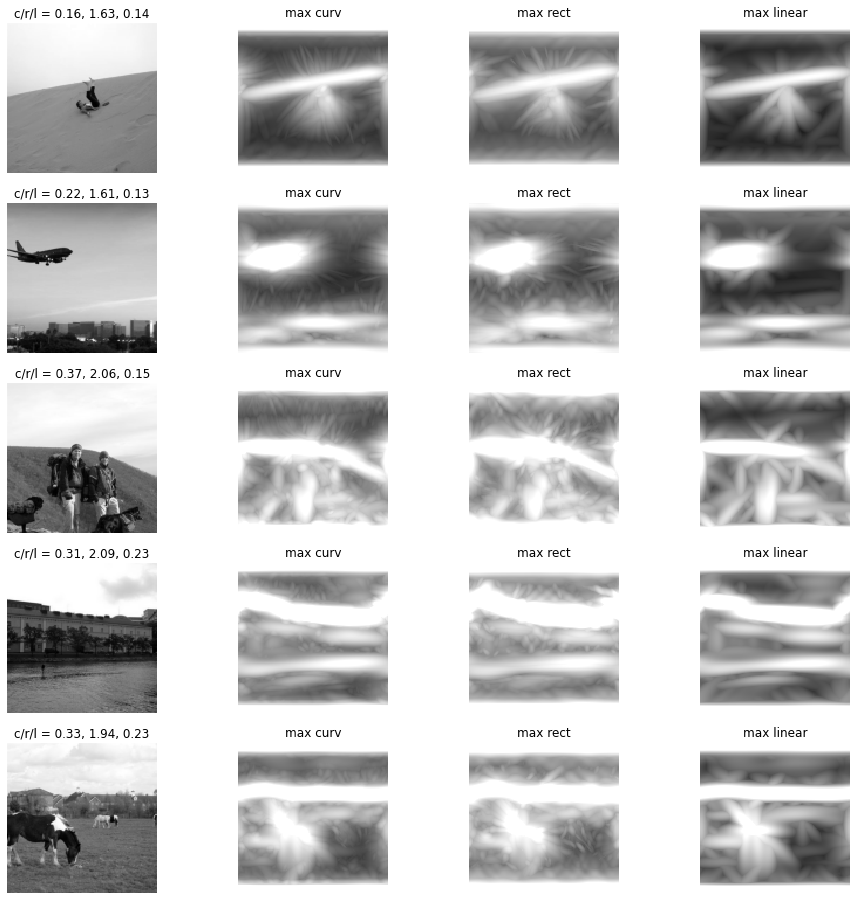

In [51]:
plt.figure(figsize=(20,16));
pi=0

# ims2plot = np.flip(np.argsort(curv_unique_score))[0:5]
combined_score = rect_unique_score/(curv_unique_score+lin_unique_score)
ims2plot = np.flip(np.argsort(combined_score))[0:5]
    
vmax = 3.0

for ii in ims2plot:
    
    filename = file_list[ii]
    image_raw = skio.imread(filename)
    image_resized = resize(image_raw, [image_size, image_size])
    image_gray = rgb2gray(image_resized)
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_gray, cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(curv_unique_score[ii], \
                                          rect_unique_score[ii], \
                                          lin_unique_score[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_curv_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_rect_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_lin_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max linear')
    plt.axis('off')
    
    pi+=1
